# **A hybrid classification model based on clustering: Online Retail II dataset**
### **In this notebook I will try to do an exploratory data analysis, clustering and finally classification based on clustering for the Online Retail II dataset, found in the UCI machine learning repository.**

<h1 id="Exploratory_Data_Analysis">
1. Exploratory Data Analysis
<a class="anchor-link" href="https://www.kaggle.com/johnmantios/travel-review-ratings-dataset/edit/run/47115230#Exploratory_Data_Analysis">¶</a>
</h1>

In [2]:
import numpy as np
import pandas as pd
import os


data = pd.read_csv('/Users/johnmantios1/Desktop/Διπλωματική/online retail/online_retail_II.csv')

data

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01 07:45:00,6.95,13085.0,United Kingdom
1,489434,79323P,PINK CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom
2,489434,79323W,WHITE CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom
3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48,2009-12-01 07:45:00,2.10,13085.0,United Kingdom
4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01 07:45:00,1.25,13085.0,United Kingdom
...,...,...,...,...,...,...,...,...
1067366,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680.0,France
1067367,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680.0,France
1067368,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680.0,France
1067369,581587,22138,BAKING SET 9 PIECE RETROSPOT,3,2011-12-09 12:50:00,4.95,12680.0,France


In [3]:
data.isnull().sum()

Invoice             0
StockCode           0
Description      4382
Quantity            0
InvoiceDate         0
Price               0
Customer ID    243007
Country             0
dtype: int64

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1067371 entries, 0 to 1067370
Data columns (total 8 columns):
 #   Column       Non-Null Count    Dtype  
---  ------       --------------    -----  
 0   Invoice      1067371 non-null  object 
 1   StockCode    1067371 non-null  object 
 2   Description  1062989 non-null  object 
 3   Quantity     1067371 non-null  int64  
 4   InvoiceDate  1067371 non-null  object 
 5   Price        1067371 non-null  float64
 6   Customer ID  824364 non-null   float64
 7   Country      1067371 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 65.1+ MB


In [5]:
pd.set_option("display.max_rows", 101)
pd.set_option("display.max_columns", 10)


In [6]:
#items whose price is negative
negprice = data[data['Price'] < 0].sum() 

#items whose quantity is negative
negquantity = data[data['Quantity'] < 0].count()


In [7]:
np.set_printoptions(threshold=np.inf)
#df = pd.DataFrame(data)
data['Description'].unique()

array(['15CM CHRISTMAS GLASS BALL 20 LIGHTS', 'PINK CHERRY LIGHTS',
       ' WHITE CHERRY LIGHTS', 'RECORD FRAME 7" SINGLE SIZE ',
       'STRAWBERRY CERAMIC TRINKET BOX', 'PINK DOUGHNUT TRINKET POT ',
       'SAVE THE PLANET MUG', 'FANCY FONT HOME SWEET HOME DOORMAT',
       'CAT BOWL ', 'DOG BOWL , CHASING BALL DESIGN',
       'HEART MEASURING SPOONS LARGE',
       'LUNCHBOX WITH CUTLERY FAIRY CAKES ', 'DOOR MAT BLACK FLOCK ',
       'LOVE BUILDING BLOCK WORD', 'HOME BUILDING BLOCK WORD',
       'ASSORTED COLOUR BIRD ORNAMENT', ' PEACE WOODEN BLOCK LETTERS',
       'CHRISTMAS CRAFT WHITE FAIRY ', 'HEART IVORY TRELLIS LARGE',
       'HEART FILIGREE DOVE LARGE', 'FULL ENGLISH BREAKFAST PLATE',
       'PIZZA PLATE IN BOX', 'BLACK DINER WALL CLOCK',
       'SET OF 3 BLACK FLYING DUCKS', 'AREA PATROLLED METAL SIGN',
       'PLEASE ONE PERSON  METAL SIGN', 'BATH BUILDING BLOCK WORD',
       'CLASSIC WHITE FRAME', 'SMALL MARSHMALLOWS PINK BOWL',
       'BISCUITS SMALL BOWL LIGHT BLUE', 'SCO

We observe that all the possible descriptions that indicate faulty items are in lowercase letters.Let's see only the lowercase descriptions.

In [8]:
df_new = data['Description']
df_new = df_new.dropna()
df_new.dropna()
df_new = pd.DataFrame(df_new)


my_list = [y for x in df_new['Description'] for y in x.split() if y.islower()]
mylist = list(set(my_list))
mylist

['aside',
 'ever',
 '45x45cm',
 'correct',
 'throw',
 'historic',
 'air',
 'away-rusty',
 'order',
 'pallet-thrown',
 'charity',
 'mix',
 'non',
 'eurobargain',
 'sit',
 'gold',
 'should',
 'orange',
 'more',
 'mystery!',
 'no',
 'is',
 'ta',
 'entry.',
 'co',
 'adjust',
 'size',
 'tick',
 'as',
 '?missing',
 'broken,',
 'mouldy',
 'marked',
 'ret',
 'shelf',
 '????missing',
 'with',
 'rust,missing',
 'rcvd',
 'missing?',
 'and',
 'blue',
 'had',
 '17129c',
 'invc/credit',
 'coded?)',
 'put',
 'a',
 'damaged/dirty',
 'away.',
 'wet/smashed/unsellable',
 'barcode',
 'multiple',
 'set?',
 'cargo',
 'amendment',
 'some',
 'came',
 'add',
 'destroyed.',
 'product.',
 'short',
 'discoloured',
 'counted',
 'previous',
 'damages',
 'smudges/thrown',
 'damages,',
 'check?',
 'bad',
 'delivery',
 'orders',
 '85123a',
 'back',
 'unsaleable.',
 'temp',
 'damages/dotcom?',
 'john',
 'up',
 'wet/rusty',
 'ctn',
 'mouldy,',
 'difference?....se',
 'fix.',
 'carton',
 'entry',
 'stat',
 'dotcomstock',

We will remove the items whose description implies they are faulty

In [9]:
data_bad = data[data['Description'].isin([
    'damages,',
 '???missing',
 'up',
 'mouldy',
 'invc/credit',
 'away',
 'mistake',
 'amazon',
 'problem',
 'tick',
 'wet/rusty',
 'lost??',
 'was',
 '???lost',
 'yacht',
 'sales',
 'oops',
 'addition',
 'smashed',
 'bottom/broken',
 'made-thrown',
 'gold',
 'test',
 'see',
 'with',
 'website',
 'this',
 'tk',
 'royal',
 'maxx',
 'alan',
 'mixed',
 'damages?',
 "6's",
 'debt',
 'torn,',
 're-adjustment',
 'some',
 'for',
 'set/6',
 'wonky',
 'colour',
 'hodge',
 'missing?',
 'wet/smashed/unsellable',
 'fast',
 'use',
 'sell.',
 'aside',
 'adjustment',
 'back',
 'missings',
 'zips',
 'show',
 'difference?....se',
 'said',
 'qnty',
 'damges',
 'product.',
 'zero',
 'faulty',
 'update',
 'stock',
 'rust,missing',
 'sit',
 'coded-23343',
 '45x30cm',
 '500g',
 'temp',
 'cracked',
 'broken,',
 'green?',
 'should',
 'incorrect',
 'damaged?',
 'bits',
 'stat',
 'pallet',
 '125g',
 'gone',
 'invc',
 'retail',
 'multiples',
 'imported',
 'wedding',
 'glass',
 'michel',
 'correct',
 'put',
 'by',
 'quality',
 'ta',
 'historic',
 'phil',
 'invcing',
 'john',
 'charity',
 'rusty-thrown',
 '3.5g',
 'more',
 'entered.',
 'taig',
 'missing',
 '25x24x12cm',
 'orders',
 'broken',
 'code',
 'unsaleable.',
 'check?',
 'space',
 'allocate',
 'box.',
 '?sold',
 'dirty',
 'is',
 's',
 'mystery!',
 'had',
 'rex',
 'box',
 'damages/showroom',
 'size',
 'charity.',
 'shelf',
 'previous',
 'a',
 'used',
 'discoloured',
 'again',
 'found',
 'away-rusty',
 'order',
 'delivery',
 'the',
 'push',
 'coded',
 'no',
 'find',
 'multiple',
 'uneven',
 'orange',
 'pink',
 'showroom',
 'poor',
 'coded?)',
 'coding',
 '60x40cm',
 'set?',
 'not',
 'damages/dotcom?',
 'in',
 'and',
 'from',
 'water',
 'came',
 'cant',
 'sell',
 'marked',
 'code?',
 'amendment',
 'short',
 'dotcom',
 "can't",
 'samples',
 'non',
 '85123a',
 'section',
 'throw',
 '20cm',
 'damaged/dirty',
 'credit',
 'wax',
 'lost?',
 'damage',
 '????missing',
 'error',
 'counted',
 'be',
 'take',
 'did',
 'dotcomstock',
 'bottom',
 'barcode',
 'rusty',
 'rotting',
 "away-can't",
 'incorr',
 'returns?',
 'thrown',
 'dirty,',
 'wrong',
 'cartons',
 'check',
 '(wrongly',
 'ebay',
 'mouldy,',
 'returned',
 'mrked',
 'checked',
 'adjust',
 'printing',
 'connections',
 '250g',
 'up?',
 'smudges/thrown',
 'online',
 'jackie',
 'marked.',
 'samples/damages',
 'set',
 'ever',
 'pallet-thrown',
 'aside.',
 'reverse',
 'inc',
 '????damages????',
 'carton',
 'damages/credits',
 'quick',
 'add',
 'display',
 'entry',
 'sets',
 'lost',
 '?display?',
 'eurobargain',
 'email',
 'credited',
 'mamage',
 'wrongly',
 'wet?',
 'so',
 'been',
 'damages',
 'computer',
 'invoice',
 '40x40cm',
 'invcd',
 'througha',
 'co',
 'damages/display',
 'ret',
 'bad',
 'away.',
 'creditted',
 '?missing',
 'w/hse',
 'entry.',
 'fixed',
 'fix',
 'boxes',
 'mailout',
 'incorrectly',
 'given',
 '17129c',
 'individually?',
 'to',
 're',
 'on',
 'sold',
 'my',
 'etc',
 'damaged',
 'ctn',
 'mix',
 'as',
 'blue',
 'sets?',
 '?lost',
 'fix.',
 'label',
 'donated',
 'crushed',
 'air',
 'c',
 'into',
 'connor',
 'destroyed.',
 'cargo',
 'debenhams',
 '45x45cm',
 'stands',
 'rcvd',
 'wet'
    
    
    
    
])]

In [10]:
data = data[~data.apply(tuple,1).isin(data_bad.apply(tuple,1))] 

In [11]:
#replace null customer values with 99999
data[['Customer ID']] =data[['Customer ID']].fillna(99999)
#replace null description values with 'Unknown'
data[['Description']] =data[['Description']].fillna('Unknown')

#leave only positive quantities and known customer IDs
data = data[data['Quantity'] > 0]
data = data[data['Customer ID'] != 99999]

# Removing returned products (Invoice numbers starting with C) from the data set
data = data[~data["Invoice"].str.contains("C", na = False)]

data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 805620 entries, 0 to 1067370
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Invoice      805620 non-null  object 
 1   StockCode    805620 non-null  object 
 2   Description  805620 non-null  object 
 3   Quantity     805620 non-null  int64  
 4   InvoiceDate  805620 non-null  object 
 5   Price        805620 non-null  float64
 6   Customer ID  805620 non-null  float64
 7   Country      805620 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 55.3+ MB


In [12]:
data.shape

(805620, 8)

In [13]:
data = data.drop_duplicates()

In [14]:
data.shape

(779495, 8)

# RFM Implementation

We will make 3 different dataframes: one containing the Customer's ID and amount he/she spent, one containing the Customer's ID and the frequency of purchases and one containing the Customer's ID and the recency of purchases. In the end we will merge those together.

In [15]:
amount = pd.DataFrame(data.Quantity * data.Price, columns = ['Amount'])

amount

,Amount
0,83.40
1,81.00
2,81.00
3,100.80
4,30.00
...,...
1067366,12.60
1067367,16.60
1067368,16.60
1067369,14.85


In [16]:
data_cust = np.array(data['Customer ID'], dtype=np.object)

data_cust = pd.DataFrame(data_cust, columns = ["Customer ID"])

data_cust = pd.concat(objs = [data_cust, amount], axis = 1, ignore_index = False)

monetary = data_cust.groupby(by = ["Customer ID"]).Amount.sum()

monetary = monetary.reset_index()
monetary = monetary[monetary['Customer ID'] != 99999]
monetary

,Customer ID,Amount
0,12346.0,318.63
1,12347.0,3167.30
2,12348.0,759.85
3,12349.0,1931.32
4,12350.0,170.50
...,...,...
5876,18283.0,28145.57
5877,18284.0,199.40
5878,18285.0,359.71
5879,18286.0,1035.55


In [17]:
frequency = data[['Customer ID', 'Invoice']]

k = frequency.groupby("Customer ID").Invoice.count()
k = pd.DataFrame(k)
k = k.reset_index()
k.columns = ["Customer ID", "Frequency"]
k.head()

,Customer ID,Frequency
0,12346.0,34
1,12347.0,222
2,12348.0,51
3,12349.0,175
4,12350.0,17


In [18]:
import datetime as dt

data["InvoiceDate"].max() # Last invoice date

'2011-12-09 12:50:00'

In [19]:
today_date = dt.datetime(2011,12,9) # last invoice date is assigned to today_date variable

In [20]:
# The type of Customer ID variable needs to be turned into an integer for following commands.
data["Customer ID"] = data["Customer ID"].astype(int) 

In [21]:
# The type of InvoiceDate variable needs to be turned into datetime for following commands.
data["InvoiceDate"] = pd.to_datetime(data["InvoiceDate"])

In [22]:
# Grouping the last invoice dates according to the Customer ID variable, subtracting them from today_date, and assigning them as recency
recency = (today_date - data.groupby("Customer ID").agg({"InvoiceDate":"max"}))
# Rename column name as Recency
recency.rename(columns = {"InvoiceDate":"Recency"}, inplace = True)
# Change the values to day format
recency_df = recency["Recency"].apply(lambda x: x.days)
recency_df.head()

Customer ID
12346    324
12347      1
12348     74
12349     17
12350    309
Name: Recency, dtype: int64

In [23]:
RFM = k.merge(monetary, on = "Customer ID")
RFM = RFM.merge(recency_df, on = "Customer ID")
RFM

,Customer ID,Frequency,Amount,Recency
0,12346.0,34,318.63,324
1,12347.0,222,3167.30,1
2,12348.0,51,759.85,74
3,12349.0,175,1931.32,17
4,12350.0,17,170.50,309
...,...,...,...,...
5876,18283.0,938,28145.57,2
5877,18284.0,28,199.40,430
5878,18285.0,12,359.71,659
5879,18286.0,67,1035.55,475


## Outlier Detection

In [23]:
import plotly.express as px

fig = px.box(RFM, y = [ 'Frequency', 'Amount'] )
fig.show()

In [24]:
#outlier treatment 

Q1 = RFM.Amount.quantile(0.25)
Q3 = RFM.Amount.quantile(0.75)
IQR = Q3 - Q1
RFM = RFM[(RFM.Amount >= (Q1 - 1.5*IQR)) & (RFM.Amount <= (Q1 + 1.5*IQR))]

In [25]:
#outlier treatment 

Q1 = RFM.Frequency.quantile(0.25)
Q3 = RFM.Frequency.quantile(0.75)
IQR = Q3 - Q1
RFM = RFM[(RFM.Frequency >= (Q1 - 1.5*IQR)) & (RFM.Frequency <= (Q1 + 1.5*IQR))]

In [199]:
fig = px.box(RFM, y = [ 'Recency'] )
fig.show()

## Scaling (Standardization)

In [26]:
from sklearn.preprocessing import normalize, StandardScaler


In [27]:
RFM = RFM.drop(['Customer ID'], axis=1)

In [28]:
standard_scaler = StandardScaler()
RFM = standard_scaler.fit_transform(RFM)

#RFM = pd.DataFrame(RFM)
RFM = pd.DataFrame(data = RFM, columns = ['Frequency', 'Amount', 'Recency'])

RFM

,Frequency,Amount,Recency
0,-0.136801,-0.343723,0.321618
1,0.444854,0.434165,-0.830252
2,-0.718457,-0.604882,0.252506
3,-0.581597,-0.721754,0.551992
4,2.224036,1.164892,-1.009944
...,...,...,...
4070,-0.718457,-0.684149,-0.346467
4071,-0.889532,-0.259715,-1.143561
4072,-0.342092,-0.553931,0.810011
4073,-0.889532,-0.271298,1.865124


<h1 id="Clustering">
2. Clustering
<a class="anchor-link" href="https://www.kaggle.com/johnmantios/travel-review-ratings-dataset/edit/run/47115230#Clustering">¶</a>
</h1>

Let's assess the clusterability of the dataset using the hopkins statistic. According to the pyclustertend library, on a scale from 0 to 1, the lower the score, the better the clusterability of the dataset

In [30]:
from pyclustertend import hopkins 

hopkins(RFM, RFM.shape[0])

0.24662789131011015

This score looks quite promising

<h1 id="agglomerative">
2.1 Agglomerative Clustering
<a class="anchor-link" href="https://www.kaggle.com/johnmantios/travel-review-ratings-dataset/edit/run/47115230#agglomerative">¶</a>
</h1>

We begin the clustering process with the agglomerative clustering algorithm for one simple reason: it is a hierarchical clustering algorithm, so we simplify the problem of having to choose beforehand the number of clusters in our model.Hierarchical clustering does not avoid the problem with choosing the number of clusters. Simply - it constructs the tree spaning over all samples, which shows which samples (later on - clusters) merge together to create a bigger cluster. This happens recursively till you have just two clusters (this is why the default number of clusters is 2) which are merged to the whole dataset.

Firstly, we are going to determine which linkage method to use. In order to do that we will calculate the cophenet index. Cophenet index is a measure of the correlation between the distance of points in feature space and distance on the dendrogram. If the distance between these points increases as the dendrogram distance between the clusters does then the Cophenet index is closer to 1. So, values closer to 1 mean a better linkage method.

In [31]:
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster import hierarchy
from sklearn.cluster import AgglomerativeClustering
from scipy.spatial.distance import pdist
import plotly.graph_objects as go

Z = hierarchy.linkage(RFM, 'ward')

c, coph_dists = hierarchy.cophenet(Z, pdist(RFM, 'hamming'))

ward = c


A = hierarchy.linkage(RFM,'average')

c, coph_dists = hierarchy.cophenet(A, pdist(RFM, 'hamming'))

average = c


B = hierarchy.linkage(RFM,'single')

c, coph_dists = hierarchy.cophenet(B, pdist(RFM, 'hamming'))

single = c


C = hierarchy.linkage(RFM,'complete')

c, coph_dists = hierarchy.cophenet(C, pdist(RFM, 'hamming'))

complete = c


D = hierarchy.linkage(RFM,'weighted')

c, coph_dists = hierarchy.cophenet(D, pdist(RFM, 'hamming'))

weighted = c


E = hierarchy.linkage(RFM,'centroid')

c, coph_dists = hierarchy.cophenet(E, pdist(RFM, 'hamming'))

centroid = c

F = hierarchy.linkage(RFM,'median')

c, coph_dists = hierarchy.cophenet(F, pdist(RFM, 'hamming'))

median = c


metrics=['ward', 'average', 'single', 'complete', 'weighted', 'centroid', 'median']


fig = go.Figure([go.Bar(x=metrics, y=[ward, average, single, complete, weighted, centroid, median])])
fig.show()



We clearly see that the complete linkage method is the preferred one.

Let's calculate some useful metrics that will help us decide the number of clusters. Since the ground truth labels are not known we will use such metrics like the silhouette coefficient, the Davies-Bouldin score and the Calinski-Harabasz Index.

In [33]:
from sklearn.metrics import silhouette_score
for n_clusters in range(2,15):
    clusterer = AgglomerativeClustering (n_clusters=n_clusters, distance_threshold = None)
    preds = clusterer.fit_predict(RFM)
    

    score = silhouette_score (RFM, preds)
    print ("For n_clusters = {}, silhouette score is {})".format(n_clusters, score))

For n_clusters = 2, silhouette score is 0.3280876104514333)
For n_clusters = 3, silhouette score is 0.26615752103062557)
For n_clusters = 4, silhouette score is 0.2649674483999797)
For n_clusters = 5, silhouette score is 0.2930950519932326)
For n_clusters = 6, silhouette score is 0.2753983791229046)
For n_clusters = 7, silhouette score is 0.27560823767318304)
For n_clusters = 8, silhouette score is 0.2827319133458116)
For n_clusters = 9, silhouette score is 0.27530950123200837)
For n_clusters = 10, silhouette score is 0.2757785083070926)
For n_clusters = 11, silhouette score is 0.25102365106178776)
For n_clusters = 12, silhouette score is 0.2562381506280047)
For n_clusters = 13, silhouette score is 0.25943041685498436)
For n_clusters = 14, silhouette score is 0.25511199026325354)


From the various silhouette score we can see that 2 clusters is the optimal number.

Let's check the Davies-Bouldin score.We want a values as close to 0 as possible

In [34]:
from sklearn.metrics import davies_bouldin_score

for n_clusters in range(2,10):
    clusterer = AgglomerativeClustering (n_clusters=n_clusters, distance_threshold = None)
    preds = clusterer.fit_predict(RFM)
    
    score = davies_bouldin_score (RFM , preds)
    print ("For n_clusters = {}, the Davies-Bouldin score is {})".format(n_clusters, score))

For n_clusters = 2, the Davies-Bouldin score is 1.1928667961189992)
For n_clusters = 3, the Davies-Bouldin score is 1.0101039966035072)
For n_clusters = 4, the Davies-Bouldin score is 1.2542726218460587)
For n_clusters = 5, the Davies-Bouldin score is 1.0529671346036853)
For n_clusters = 6, the Davies-Bouldin score is 1.0391951695845862)
For n_clusters = 7, the Davies-Bouldin score is 0.9899453355172481)
For n_clusters = 8, the Davies-Bouldin score is 1.0768836192600162)
For n_clusters = 9, the Davies-Bouldin score is 1.1673120597395377)


3 clusters have the lowest score from a reasonable range of clusters.

Calinski-Harabasz index.We want as high a score as possible

In [35]:
from sklearn.metrics import calinski_harabasz_score

for n_clusters in range(2,10):
    clusterer = AgglomerativeClustering (n_clusters=n_clusters, distance_threshold = None)
    preds = clusterer.fit_predict(RFM)
    
    score = calinski_harabasz_score(RFM, preds)
    print ("For n_clusters = {}, the Calinski-Harabasz score is {})".format(n_clusters, score))

For n_clusters = 2, the Calinski-Harabasz score is 2402.7123680501636)
For n_clusters = 3, the Calinski-Harabasz score is 1948.2518276084893)
For n_clusters = 4, the Calinski-Harabasz score is 1918.634851622396)
For n_clusters = 5, the Calinski-Harabasz score is 2111.1084418773366)
For n_clusters = 6, the Calinski-Harabasz score is 2119.1869476222896)
For n_clusters = 7, the Calinski-Harabasz score is 2159.234272533591)
For n_clusters = 8, the Calinski-Harabasz score is 2178.5378010415902)
For n_clusters = 9, the Calinski-Harabasz score is 2057.0534164928736)


2 clusters

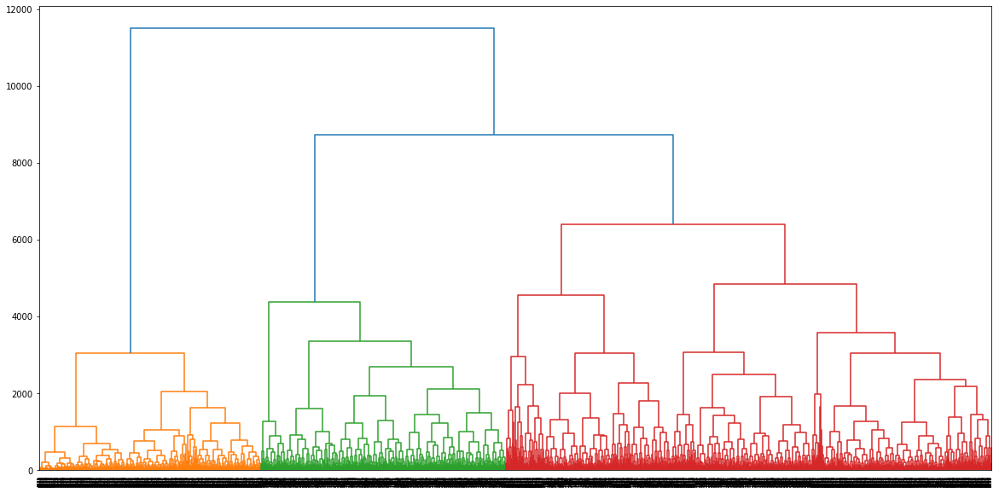

In [36]:
import matplotlib.pyplot as plt
%matplotlib inline

model = AgglomerativeClustering(distance_threshold=0, n_clusters = None)
model = model.fit(RFM)

Z = hierarchy.linkage(model.children_, 'complete')

plt.figure(figsize=(20,10))

dn = hierarchy.dendrogram(Z)

From the dendrogram we observe that it is going to be 4 clusters (cutting point = 6000)

Now, let's plot our data using the labels that the algorithm generated.We are going to make a scatterplot.

In [37]:
import seaborn as sns

model = AgglomerativeClustering(distance_threshold=None, n_clusters = 4)
model = model.fit(RFM)
y_agg=model.fit_predict(RFM)



In [38]:
RFM_agg = RFM.copy()

RFM_agg['Agg_Labels'] = y_agg

fig = px.scatter_3d(RFM_agg, x='Frequency', y='Amount', z='Recency',
              color= 'Agg_Labels')
fig.show()

<h1 id="DBSCAN">
2.2 DBSCAN
<a class="anchor-link" href="https://www.kaggle.com/johnmantios/travel-review-ratings-dataset/edit/run/47115230#DBSCAN">¶</a>
</h1>

Following, we apply to our data set the DBSCAN algorithm.DBSCAN works by running a connected components algorithm across the different core points. If two core points share border points, or a core point is a border point in another core point’s neighborhood, then they’re part of the same connected component, which forms a cluster.
A low min_samples parameter means it will build more clusters from noise, so we shouldn't choose it too small.
The DBSCAN paper suggests to choose minPts based on the dimensionality, and eps based on the elbow in the k-distance graph.
For eps, we can try to do a knn distance histogram and choose a "knee" there, but there might be no visible one, or multiple.

In the more recent publication

Schubert, E., Sander, J., Ester, M., Kriegel, H. P., & Xu, X. (2017).
DBSCAN Revisited, Revisited: Why and How You Should (Still) Use DBSCAN.
ACM Transactions on Database Systems (TODS), 42(3), 19.


The authors suggest to use a larger minpts for large and noisy data sets, and to adjust epsilon depending on whether you get too large clusters (decrease epsilon) or too much noise (increase epsilon). Clustering requires iterations.


Let's apply the Knee method using KNN to find the optimal eps value for our model. Since KNN is a supervised learning algorithm and our data is not labeled, we will apply a general rule of thumb popularized by the "Pattern Classification" book by Duda et al., saying that the optimal K value usually found is the square root of N, where N is the total number of samples.

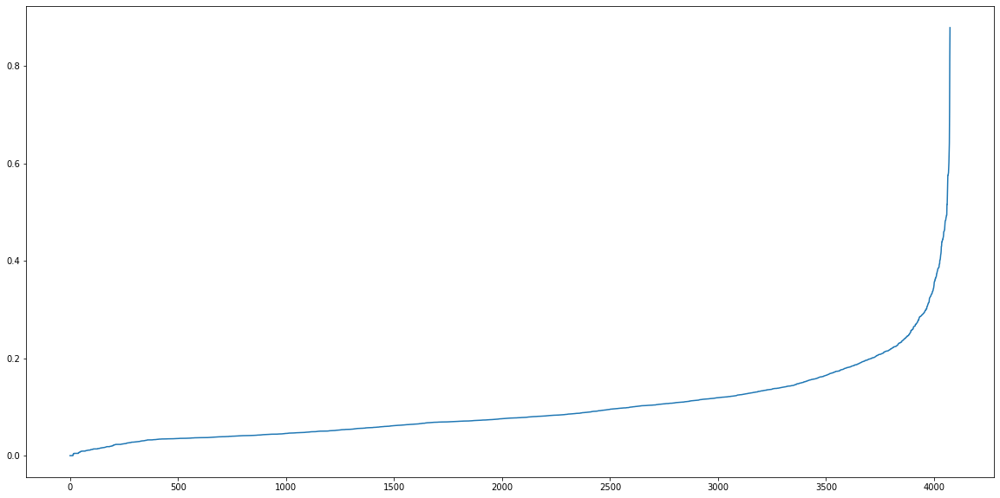

In [229]:
from sklearn.neighbors import NearestNeighbors

nearest_neighbors = NearestNeighbors(n_neighbors=63) #sqrt(samples = 4082)
nearest_neighbors.fit(RFM)
distances, indices = nearest_neighbors.kneighbors(RFM)
distances = np.sort(distances, axis=0)[:, 1]
#print(distances)
plt.figure(figsize=(20,10))
plt.plot(distances)
plt.show()

Optimal value for eps where a 'knee' is formed is 0.3.

A general rule of thumb is ==> Min points ≥dimensionality +1
After some trial and error, min_samples = 7 produces the lowest amount of noise possible


In [235]:
from sklearn.cluster import DBSCAN

model2 = DBSCAN(eps = 0.3, min_samples = 13)

model2 = model2.fit(RFM)

y_db=model2.labels_

RFM_DB = RFM.copy()
RFM_DB["DBLabels"] = y_db

RFM_DB["DBLabels"].value_counts(0)

 0    3264
-1     747
 1      27
 2      19
 3      18
Name: DBLabels, dtype: int64

In [236]:
fig = px.scatter_3d(RFM_DB, x='Frequency', y='Amount', z='Recency',
              color= 'DBLabels')
fig.show()

In [237]:
RFM_DB_filtered = RFM_DB.copy()

# Get names of indexes for which column DB_Labels has value -1
indexNames = RFM_DB_filtered[ RFM_DB_filtered['DBLabels'] == -1 ].index
# Delete these row indexes from dataFrame
RFM_DB_filtered.drop(indexNames , inplace=True)

RFM_DB_filtered['DBLabels'].unique()

array([0, 1, 3, 2])

In [238]:
#plot clustered data without noise

fig = px.scatter_3d(RFM_DB_filtered, x='Frequency', y='Amount', z='Recency',
              color= 'DBLabels')
fig.show()

In [241]:
silhouette_score (RFM_DB, y_db)

0.2813870911448094

<h1 id="EM">
2.3 EM using GMM
<a class="anchor-link" href="https://www.kaggle.com/johnmantios/travel-review-ratings-dataset/edit/run/47115230#EM">¶</a>
</h1>

At its simplest, GMM is also a type of clustering algorithm. As its name implies, each cluster is modelled according to a different Gaussian distribution. This flexible and probabilistic approach to modelling the data means that rather than having hard assignments into clusters like k-means, we have soft assignments. This means that each data point could have been generated by any of the distributions with a corresponding probability.

Let's calculate the silhouette score for various number of n_components

In [30]:
from sklearn.mixture import GaussianMixture as GMM
from sklearn.metrics import silhouette_score

for n_components in range(2,15):
    clusterer = GMM(n_components=n_components)
    preds = clusterer.fit_predict(RFM)
    

    score = silhouette_score (RFM, preds)
    print ("For n_clusters = {}, silhouette score is {})".format(n_components, score))

For n_clusters = 2, silhouette score is 0.32039312231019407)
For n_clusters = 3, silhouette score is 0.2291252128324876)
For n_clusters = 4, silhouette score is 0.219836994326285)
For n_clusters = 5, silhouette score is 0.16884924359383405)
For n_clusters = 6, silhouette score is 0.1695325018629791)
For n_clusters = 7, silhouette score is 0.11257677853518296)
For n_clusters = 8, silhouette score is 0.06974832879107772)
For n_clusters = 9, silhouette score is 0.08910586725708763)
For n_clusters = 10, silhouette score is 0.05025065217626153)
For n_clusters = 11, silhouette score is 0.05960937555297511)
For n_clusters = 12, silhouette score is 0.04113643555547985)
For n_clusters = 13, silhouette score is 0.003114777490835953)
For n_clusters = 14, silhouette score is -0.008532002918989645)


Let's calculate the BIC score.This criterion gives us an estimation on how good the GMM in terms of predicting the data we actually have. The lower is the BIC, the better is the model to actually predict the data we have, and by extension, the true, unknown, distribution. In order to avoid overfitting, this technique penalizes models with big number of clusters.

Automatically created module for IPython interactive environment


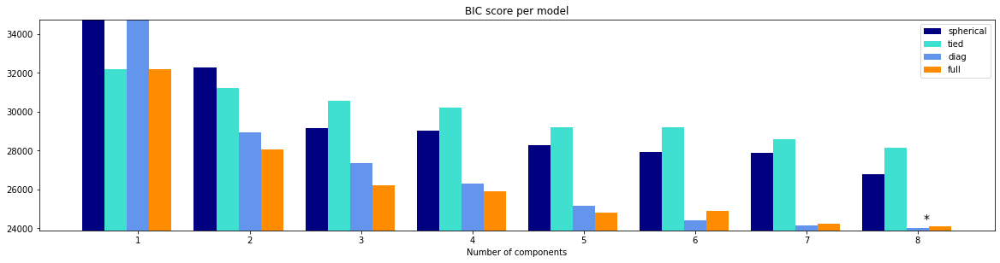

In [31]:
import numpy as np
import itertools

from scipy import linalg
import matplotlib.pyplot as plt
import matplotlib as mpl



print(__doc__)



lowest_bic = np.infty
bic = []
n_components_range = range(1, 9)
cv_types = ['spherical', 'tied', 'diag', 'full']
for cv_type in cv_types:
    for n_components in n_components_range:
        # Fit a Gaussian mixture with EM
        gmm = GMM(n_components=n_components,
                                      covariance_type=cv_type)
        gmm.fit(RFM)
        bic.append(gmm.bic(RFM))
        if bic[-1] < lowest_bic:
            lowest_bic = bic[-1]
            best_gmm = gmm

bic = np.array(bic)
color_iter = itertools.cycle(['navy', 'turquoise', 'cornflowerblue',
                              'darkorange'])
clf = best_gmm
bars = []

# Plot the BIC scores
plt.figure(figsize=(20, 10))
spl = plt.subplot(2, 1, 1)
for i, (cv_type, color) in enumerate(zip(cv_types, color_iter)):
    xpos = np.array(n_components_range) + .2 * (i - 2)
    bars.append(plt.bar(xpos, bic[i * len(n_components_range):
                                  (i + 1) * len(n_components_range)],
                        width=.2, color=color))
plt.xticks(n_components_range)
plt.ylim([bic.min() * 1.01 - .01 * bic.max(), bic.max()])
plt.title('BIC score per model')
xpos = np.mod(bic.argmin(), len(n_components_range)) + .65 +\
    .2 * np.floor(bic.argmin() / len(n_components_range))
plt.text(xpos, bic.min() * 0.97 + .03 * bic.max(), '*', fontsize=14)
spl.set_xlabel('Number of components')
spl.legend([b[0] for b in bars], cv_types)

Based on the gradient descent of the criterion, it seems that 6 clusters with a full covariance type is the optimal option.

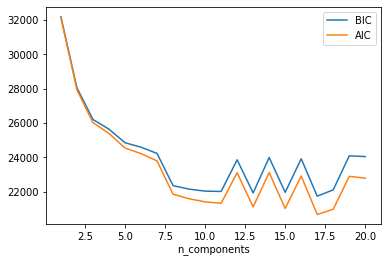

In [32]:
n_components = np.arange(1, 21)
models = [GMM(n, covariance_type='full', random_state=0).fit(RFM)
          for n in n_components]

plt.plot(n_components, [m.bic(RFM) for m in models], label='BIC')
plt.plot(n_components, [m.aic(RFM) for m in models], label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components');

The choice of number of components measures how well GMM works as a density estimator, not how well it works as a clustering algorithm. From the above plot it shows that optimal number of components is 6 or 7 (where the gradient stops decreasing)

In [33]:
RFM_gmm = RFM.copy()

RFM_gmm['gmm'] = GMM(n_components=6, random_state=42).fit_predict(RFM)

In [34]:
fig = px.scatter_3d(RFM_gmm, x='Frequency', y='Amount', z='Recency',
              color= 'gmm')
fig.show()

NameError: name 'px' is not defined

<h1 id="kmeans">
2.4 KMeans
<a class="anchor-link" href="https://www.kaggle.com/johnmantios/travel-review-ratings-dataset/edit/run/47115230#kmeans">¶</a>
</h1>

Kmeans algorithm is an iterative algorithm that tries to partition the dataset into K pre-defined distinct non-overlapping subgroups (clusters) where each data point belongs to only one group
It tries to make the intra-cluster data points as similar as possible while also keeping the clusters as different (far) as possible. It assigns data points to a cluster such that the sum of the squared distance between the data points and the cluster’s centroid (arithmetic mean of all the data points that belong to that cluster) is at the minimum. The less variation we have within clusters, the more homogeneous (similar) the data points are within the same cluster.

In [50]:
from sklearn.cluster import KMeans

from sklearn.metrics import silhouette_score
for n_clusters in range(2,15):
    clusterer = KMeans (n_clusters=n_clusters)
    preds = clusterer.fit_predict(RFM)
    

    score = silhouette_score (RFM, preds)
    print ("For n_clusters = {}, silhouette score is {})".format(n_clusters, score))

For n_clusters = 2, silhouette score is 0.3948038853527369)
For n_clusters = 3, silhouette score is 0.38530879001854157)
For n_clusters = 4, silhouette score is 0.3745648762746376)
For n_clusters = 5, silhouette score is 0.3758208077621593)
For n_clusters = 6, silhouette score is 0.34478553133774265)
For n_clusters = 7, silhouette score is 0.32459993593278585)
For n_clusters = 8, silhouette score is 0.32536337288703443)
For n_clusters = 9, silhouette score is 0.3235481952928612)
For n_clusters = 10, silhouette score is 0.3291768715239653)
For n_clusters = 11, silhouette score is 0.31315426738476254)
For n_clusters = 12, silhouette score is 0.29930076399888017)
For n_clusters = 13, silhouette score is 0.3054604665245629)
For n_clusters = 14, silhouette score is 0.307334189473977)


1 : 12224.999999999978
2 : 7124.554506035627
3 : 4748.863739200183
4 : 3773.499228382661
5 : 3206.8897872084463
6 : 2808.1841147497425
7 : 2499.327600293106
8 : 2280.9931086833226
9 : 2087.9707362610775


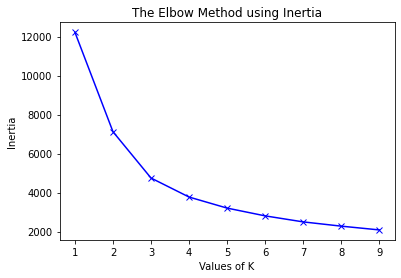

In [51]:
from scipy.spatial.distance import cdist

distortions = [] 
inertias = [] 
mapping1 = {} 
mapping2 = {} 
K = range(1,10) 
  
for k in K: 
    #Building and fitting the model 
    kmeanModel = KMeans(n_clusters=k).fit(RFM) 
    kmeanModel.fit(RFM)     
      
    distortions.append(sum(np.min(cdist(RFM, kmeanModel.cluster_centers_, 
                      'euclidean'),axis=1)) / RFM.shape[0]) 
    inertias.append(kmeanModel.inertia_) 
  
    mapping1[k] = sum(np.min(cdist(RFM, kmeanModel.cluster_centers_, 
                 'euclidean'),axis=1)) / RFM.shape[0] 
    mapping2[k] = kmeanModel.inertia_ 
    
for key,val in mapping2.items(): 
    print(str(key)+' : '+str(val))
    
plt.plot(K, inertias, 'bx-') 
plt.xlabel('Values of K') 
plt.ylabel('Inertia') 
plt.title('The Elbow Method using Inertia') 
plt.show()     

In [52]:
model4 = KMeans(n_clusters = 3)

model4 = model4.fit(RFM)

np.unique(model4.labels_)

RFM_kmeans = RFM.copy()

RFM_kmeans['kmeans'] = KMeans(n_clusters=3).fit_predict(RFM)


fig = px.scatter_3d(RFM_kmeans, x='Frequency', y='Amount', z='Recency',
              color= 'kmeans')
fig.show()

<h1 id="classification">
3 Classification
<a class="anchor-link" href="https://www.kaggle.com/johnmantios/travel-review-ratings-dataset/edit/run/47115230#classification">¶</a>
</h1>

<h2 id="Agglomerative_Dataset">
3.1 Agglomerative Dataset
<a class="anchor-link" href="https://www.kaggle.com/johnmantios/travel-review-ratings-dataset/edit/run/47115230#Agglomerative_Dataset">¶</a>
</h2>

<h3 id="Decision_Tree">
3.1.1 Decision Tree
<a class="anchor-link" href="https://www.kaggle.com/johnmantios/travel-review-ratings-dataset/edit/run/47115230#Decision_Tree">¶</a>
</h3>

In [53]:
RFM_agg.drop_duplicates()

,Frequency,Amount,Recency,Agg_Labels
0,-0.136801,-0.343723,0.321618,1
1,0.444854,0.434165,-0.830252,3
2,-0.718457,-0.604882,0.252506,1
3,-0.581597,-0.721754,0.551992,1
4,2.224036,1.164892,-1.009944,3
...,...,...,...,...
4070,-0.718457,-0.684149,-0.346467,1
4071,-0.889532,-0.259715,-1.143561,1
4072,-0.342092,-0.553931,0.810011,1
4073,-0.889532,-0.271298,1.865124,2


In [55]:
RFM_agg.describe()

,Frequency,Amount,Recency,Agg_Labels
count,4.075000e+03,4.075000e+03,4.075000e+03,4075.000000
mean,1.046198e-16,6.756695e-17,1.394931e-17,1.488589
std,1.000123e+00,1.000123e+00,1.000123e+00,1.090664
min,-1.265897e+00,-9.054806e-01,-1.175814e+00,0.000000
25%,-8.211020e-01,-7.604353e-01,-9.362245e-01,1.000000
50%,-2.736615e-01,-3.322284e-01,-2.312798e-01,1.000000
75%,6.501444e-01,4.094029e-01,7.685438e-01,3.000000
max,2.600401e+00,4.398553e+00,2.224508e+00,3.000000


In [54]:
for col in RFM_agg.columns:
    print(RFM_agg[col].value_counts())

-1.265897    118
-0.923747     87
-1.094822     85
-0.992177     80
-0.957962     80
            ... 
 2.292466     10
 2.224036     10
 2.360896      8
 2.429326      7
 2.600401      7
Name: Frequency, Length: 114, dtype: int64
-0.905481    403
-0.887498      7
-0.901778      6
-0.879035      5
-0.870572      5
            ... 
-0.279602      1
 0.296454      1
-0.564086      1
 1.143506      1
-0.040551      1
Name: Amount, Length: 3525, dtype: int64
-1.157384    39
-1.097486    37
-1.129739    34
-1.143561    32
-1.125131    31
             ..
 1.588676     1
 1.155572     1
 2.063246     1
 0.137319     1
-0.023943     1
Name: Recency, Length: 588, dtype: int64
1    1562
3    1102
0     812
2     599
Name: Agg_Labels, dtype: int64


In [263]:
X = RFM_agg.drop(['Agg_Labels'], axis=1)
y = RFM_agg['Agg_Labels']

In [264]:
fig = px.box(RFM_agg, y = RFM_agg.columns )
fig.show()

In [265]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 42, stratify=y)

In [266]:
print(y_test.value_counts()) #we secured the 20% in the classes represenation

1    313
3    220
0    162
2    120
Name: Agg_Labels, dtype: int64


In [267]:
from imblearn.over_sampling import SMOTE

sm = SMOTE(random_state = 42)
           
X_train, y_train = sm.fit_sample(X_train, y_train) 

In [268]:
y_train.value_counts()

3    1249
2    1249
1    1249
0    1249
Name: Agg_Labels, dtype: int64

# GINI CRITERION

In [63]:
from sklearn.metrics import log_loss
from sklearn.tree import DecisionTreeClassifier

training_scores = []
test_scores = []

def tree_scores(i):
    clf_gini = DecisionTreeClassifier(criterion='gini', max_depth=i, random_state = 42)
    
    
    clf_gini.fit(X_train, y_train)
    y_pred_gini = clf_gini.predict_proba(X_test)
    y_pred_train_gini = clf_gini.predict_proba(X_train)
    
     
    print('Max Depth:' ,i)    
    print('Training set score: {:.4f}'.format(clf_gini.score(X_train, y_train)))
    training_scores.append(log_loss(y_train, y_pred_train_gini))

    print('Test set score: {:.4f}'.format(clf_gini.score(X_test, y_test)))
    test_scores.append(log_loss(y_test, y_pred_gini))
     
        
for i in range(1,11):
    tree_scores(i)

Max Depth: 1
Training set score: 0.4998
Test set score: 0.4172
Max Depth: 2
Training set score: 0.7446
Test set score: 0.7890
Max Depth: 3
Training set score: 0.8595
Test set score: 0.8650
Max Depth: 4
Training set score: 0.9518
Test set score: 0.9215
Max Depth: 5
Training set score: 0.9580
Test set score: 0.9399
Max Depth: 6
Training set score: 0.9792
Test set score: 0.9607
Max Depth: 7
Training set score: 0.9872
Test set score: 0.9755
Max Depth: 8
Training set score: 0.9936
Test set score: 0.9755
Max Depth: 9
Training set score: 0.9962
Test set score: 0.9718
Max Depth: 10
Training set score: 0.9992
Test set score: 0.9730


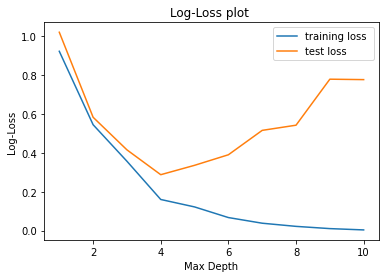

In [64]:
y = [1,2,3,4,5,6,7,8,9,10]

# plotting the line 1 points 
plt.plot(y, training_scores, label = "training loss ")

# plotting the line 2 points 
plt.plot(y, test_scores, label = "test loss ")
plt.xlabel('Max Depth')
# Set the y axis label of the current axis.
plt.ylabel('Log-Loss')
# Set a title of the current axes.
plt.title('Log-Loss plot ')
# show a legend on the plot
plt.legend()
# Display a figure.
plt.show()

In [65]:
from sklearn.model_selection import GridSearchCV

parameters = {'max_depth':range(1,11)}
clf = GridSearchCV(DecisionTreeClassifier(criterion='gini', random_state = 42),  parameters, n_jobs=4)
clf.fit(X=X_train, y=y_train)
tree_model = clf.best_estimator_
print (clf.best_score_, clf.best_params_) 

0.9755797797797797 {'max_depth': 10}


In [66]:
from sklearn.model_selection import cross_val_score

clf_gini = DecisionTreeClassifier(criterion='gini', max_depth=4, random_state = 42)

print('Cross-Validation Score:',np.mean(cross_val_score(clf_gini, X_train, y_train, cv=10)))

Cross-Validation Score: 0.9447651302605211


In [67]:
clf_gini = DecisionTreeClassifier(criterion='gini', max_depth=4, random_state = 42)

clf_gini.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=4, random_state=42)

In [68]:
y_pred_gini = clf_gini.predict(X_test)

In [69]:
print('Training set score: {:.4f}'.format(clf_gini.score(X_train, y_train)))

print('Test set score: {:.4f}'.format(clf_gini.score(X_test, y_test)))

Training set score: 0.9518
Test set score: 0.9215


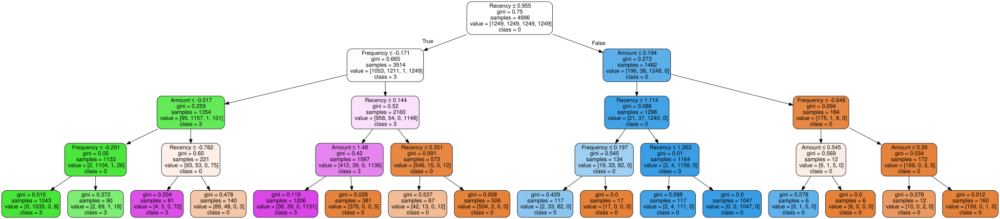

In [70]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import graphviz
from sklearn import tree



dot_data = tree.export_graphviz(clf_gini, out_file=None, 
                              feature_names=X_train.columns,  
                              class_names=y_train.apply(str),  
                              filled=True, rounded=True,  
                              special_characters=True)

graph = graphviz.Source(dot_data) 

graph 

In [71]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix

cf_matrix = confusion_matrix(y_test, y_pred_gini)

cf_matrix

array([[155,   0,   4,   3],
       [ 17, 269,   7,  20],
       [  1,   0, 119,   0],
       [  5,   7,   0, 208]])

[Text(0, 0.5, '0'), Text(0, 1.5, '2'), Text(0, 2.5, '1'), Text(0, 3.5, '3')]

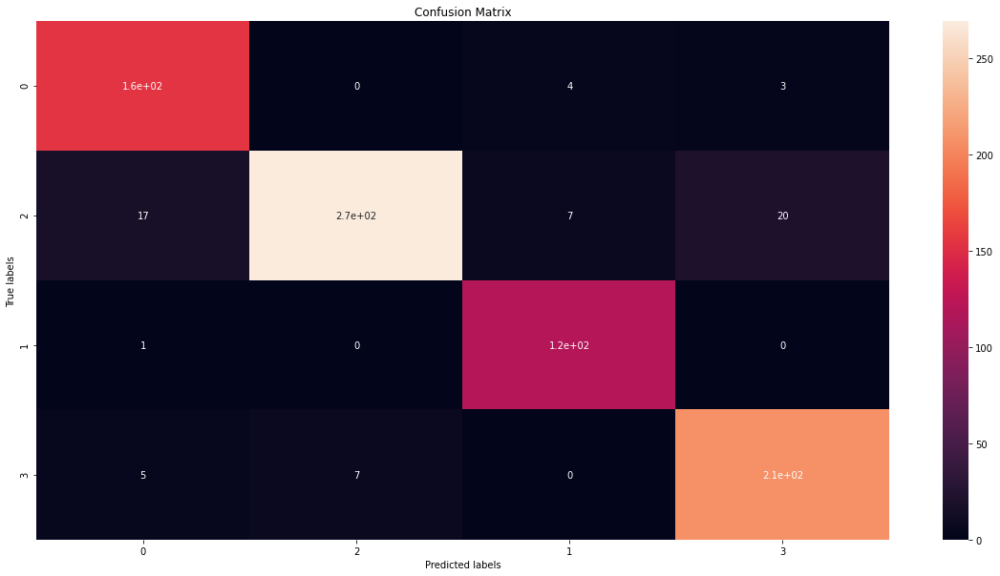

In [72]:
plt.figure(figsize=(20,10))
ax= plt.subplot()
sns.heatmap(cf_matrix, annot=True, ax = ax)  #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(y_test.unique())
ax.yaxis.set_ticklabels(y_test.unique())

In [73]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred_gini))

              precision    recall  f1-score   support

           0       0.87      0.96      0.91       162
           1       0.97      0.86      0.91       313
           2       0.92      0.99      0.95       120
           3       0.90      0.95      0.92       220

    accuracy                           0.92       815
   macro avg       0.92      0.94      0.92       815
weighted avg       0.93      0.92      0.92       815



In [75]:
import dataframe_image as dfi

report = classification_report(y_test, y_pred_gini, output_dict=True)

df_report = pd.DataFrame(report).transpose()

dfi.export(df_report, 'agg_decision_tree_gini.png')

# ENTROPY CRITERION

In [76]:
from sklearn.metrics import log_loss
from sklearn.tree import DecisionTreeClassifier

training_scores = []
test_scores = []

def tree_scores(i):
    clf_gini = DecisionTreeClassifier(criterion='entropy', max_depth=i, random_state = 42)
    
    
    clf_gini.fit(X_train, y_train)
    y_pred_gini = clf_gini.predict_proba(X_test)
    y_pred_train_gini = clf_gini.predict_proba(X_train)
    
     
    print('Max Depth:' ,i)    
    print('Training set score: {:.4f}'.format(clf_gini.score(X_train, y_train)))
    training_scores.append(log_loss(y_train, y_pred_train_gini))

    print('Test set score: {:.4f}'.format(clf_gini.score(X_test, y_test)))
    test_scores.append(log_loss(y_test, y_pred_gini))
     
        
for i in range(1,11):
    tree_scores(i)

Max Depth: 1
Training set score: 0.5000
Test set score: 0.4172
Max Depth: 2
Training set score: 0.7446
Test set score: 0.7865
Max Depth: 3
Training set score: 0.8567
Test set score: 0.8589
Max Depth: 4
Training set score: 0.9494
Test set score: 0.9153
Max Depth: 5
Training set score: 0.9526
Test set score: 0.9215
Max Depth: 6
Training set score: 0.9780
Test set score: 0.9669
Max Depth: 7
Training set score: 0.9866
Test set score: 0.9730
Max Depth: 8
Training set score: 0.9924
Test set score: 0.9706
Max Depth: 9
Training set score: 0.9956
Test set score: 0.9767
Max Depth: 10
Training set score: 0.9980
Test set score: 0.9755


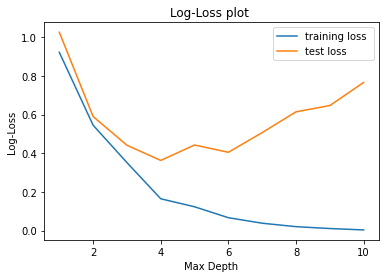

In [77]:
y = [1,2,3,4,5,6,7,8,9,10]

# plotting the line 1 points 
plt.plot(y, training_scores, label = "training loss ")

# plotting the line 2 points 
plt.plot(y, test_scores, label = "test loss ")
plt.xlabel('Max Depth')
# Set the y axis label of the current axis.
plt.ylabel('Log-Loss')
# Set a title of the current axes.
plt.title('Log-Loss plot ')
# show a legend on the plot
plt.legend()
# Display a figure.
plt.show()

In [78]:
parameters = {'max_depth':range(1,11)}
clf = GridSearchCV(DecisionTreeClassifier(criterion='entropy', random_state = 42),  parameters, n_jobs=4)
clf.fit(X=X_train, y=y_train)
tree_model = clf.best_estimator_
print (clf.best_score_, clf.best_params_) 

0.9795837837837837 {'max_depth': 10}


In [79]:
clf_en = DecisionTreeClassifier(criterion='entropy', max_depth=4, random_state = 42)

print('Cross-Validation Score:',np.mean(cross_val_score(clf_en, X_train, y_train, cv=10)))

Cross-Validation Score: 0.9467663326653307


In [80]:
clf_en = DecisionTreeClassifier(criterion='entropy', max_depth=4, random_state = 42)

clf_en.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=4, random_state=42)

In [81]:
y_pred_en = clf_gini.predict(X_test)

In [82]:
print('Training set score: {:.4f}'.format(clf_en.score(X_train, y_train)))

print('Test set score: {:.4f}'.format(clf_en.score(X_test, y_test)))

Training set score: 0.9494
Test set score: 0.9153


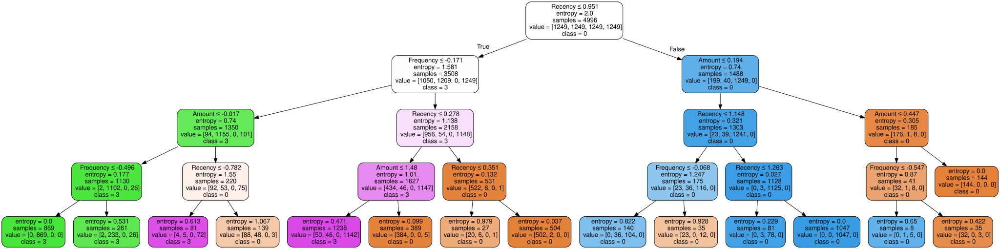

In [84]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import graphviz
from sklearn import tree



dot_data = tree.export_graphviz(clf_en, out_file=None, 
                              feature_names=X_train.columns,  
                              class_names=y_train.apply(str),  
                              filled=True, rounded=True,  
                              special_characters=True)

graph = graphviz.Source(dot_data) 

graph 

In [85]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix

cf_matrix = confusion_matrix(y_test, y_pred_en)

cf_matrix

array([[155,   0,   4,   3],
       [ 17, 269,   7,  20],
       [  1,   0, 119,   0],
       [  5,   7,   0, 208]])

[Text(0, 0.5, '0'), Text(0, 1.5, '2'), Text(0, 2.5, '1'), Text(0, 3.5, '3')]

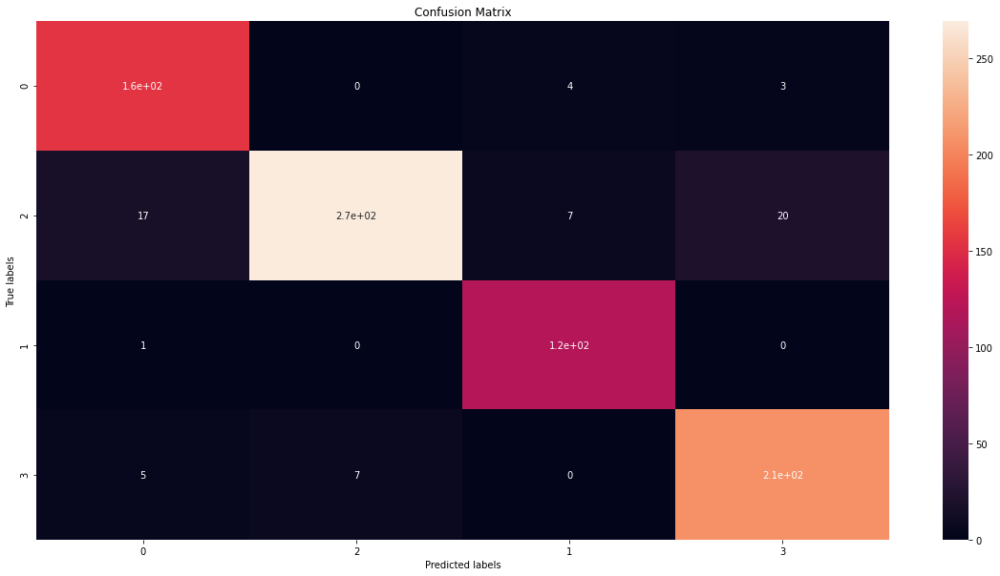

In [86]:
plt.figure(figsize=(20,10))
ax= plt.subplot()
sns.heatmap(cf_matrix, annot=True, ax = ax)  #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(y_test.unique())
ax.yaxis.set_ticklabels(y_test.unique())

In [87]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred_en))

              precision    recall  f1-score   support

           0       0.87      0.96      0.91       162
           1       0.97      0.86      0.91       313
           2       0.92      0.99      0.95       120
           3       0.90      0.95      0.92       220

    accuracy                           0.92       815
   macro avg       0.92      0.94      0.92       815
weighted avg       0.93      0.92      0.92       815



In [88]:
import dataframe_image as dfi

report = classification_report(y_test, y_pred_en, output_dict=True)

df_report = pd.DataFrame(report).transpose()

dfi.export(df_report, 'agg_decision_tree_entropy.png')

# GRADIENT BOOSTING

In [89]:
from sklearn.ensemble import GradientBoostingClassifier

training_loss = []
test_loss = []

def tree_scores(i):
    clf_gb = GradientBoostingClassifier( max_depth=i, random_state = 42)
    
    
    clf_gb.fit(X_train, y_train.values.ravel())
    y_pred_gb = clf_gb.predict_proba(X_test)
    y_pred_train_gb = clf_gb.predict_proba(X_train)
    
     
    print('Max Depth:' ,i)    
    print('Training set score: {:.4f}'.format(clf_gb.score(X_train, y_train)))
    training_loss.append(log_loss(y_train, y_pred_train_gb))

    print('Test set score: {:.4f}'.format(clf_gb.score(X_test, y_test)))
    test_loss.append(log_loss(y_test, y_pred_gb))
     
        
for i in range(1,11):
    tree_scores(i)

Max Depth: 1
Training set score: 0.9656
Test set score: 0.9460
Max Depth: 2
Training set score: 0.9852
Test set score: 0.9706
Max Depth: 3
Training set score: 0.9986
Test set score: 0.9730
Max Depth: 4
Training set score: 1.0000
Test set score: 0.9755
Max Depth: 5
Training set score: 1.0000
Test set score: 0.9779
Max Depth: 6
Training set score: 1.0000
Test set score: 0.9791
Max Depth: 7
Training set score: 1.0000
Test set score: 0.9816
Max Depth: 8
Training set score: 1.0000
Test set score: 0.9804
Max Depth: 9
Training set score: 1.0000
Test set score: 0.9767
Max Depth: 10
Training set score: 1.0000
Test set score: 0.9730


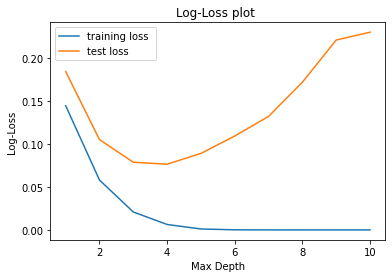

In [90]:
y = [1,2,3,4,5,6,7,8,9,10]

# plotting the line 1 points 
plt.plot(y, training_loss, label = "training loss ")

# plotting the line 2 points 
plt.plot(y, test_loss, label = "test loss ")
plt.xlabel('Max Depth')
# Set the y axis label of the current axis.
plt.ylabel('Log-Loss')
# Set a title of the current axes.
plt.title('Log-Loss plot ')
# show a legend on the plot
plt.legend()
# Display a figure.
plt.show()

In [192]:
parameters = {'max_depth':range(1,11)}
clf = GridSearchCV(GradientBoostingClassifier( max_depth=i, random_state = 42),  parameters, n_jobs=4)
clf.fit(X=X_train, y=y_train.values.ravel())
tree_model = clf.best_estimator_
print (clf.best_score_, clf.best_params_) 

GridSearchCV(estimator=GradientBoostingClassifier(max_depth=10,
                                                  random_state=42),
             n_jobs=4, param_grid={'max_depth': range(1, 11)})

0.9845056065239552 {'max_depth': 6}


In [91]:
clf_gb = GradientBoostingClassifier( max_depth=3, random_state = 42)

print('Cross-Validation Score:',np.mean(cross_val_score(clf_gb, X_train, y_train.values.ravel(), cv=10)))

Cross-Validation Score: 0.982192384769539


In [92]:
clf_gb = GradientBoostingClassifier( max_depth=3, random_state = 42)

clf_gb.fit(X_train, y_train.values.ravel())

GradientBoostingClassifier(random_state=42)

In [93]:
y_pred_gb = clf_gb.predict(X_test)

In [94]:
# print the scores on training and test set

print('Training set score: {:.4f}'.format(clf_gb.score(X_train, y_train)))

print('Test set score: {:.4f}'.format(clf_gb.score(X_test, y_test)))

Training set score: 0.9986
Test set score: 0.9730


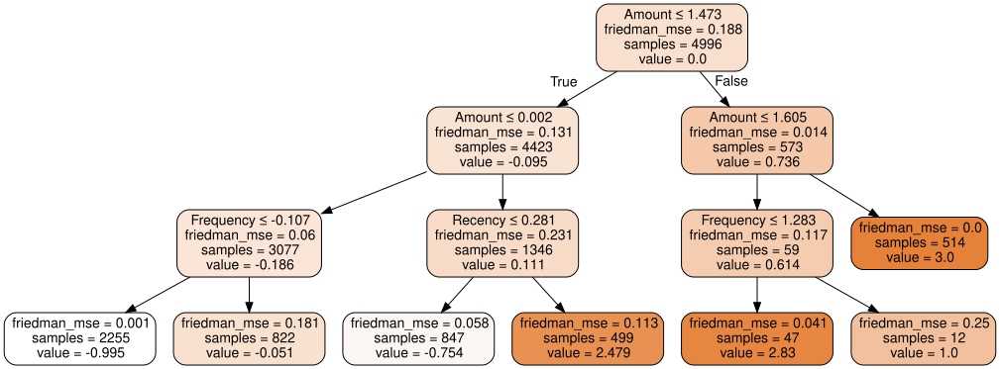

In [95]:
dot_data = tree.export_graphviz(clf_gb.estimators_[0, 0], out_file=None, 
                              feature_names=X_train.columns,  
                              class_names=y_train.apply(str),  
                              filled=True, rounded=True,  
                              special_characters=True)

graph = graphviz.Source(dot_data) 

graph 

In [96]:
cm = confusion_matrix(y_test, y_pred_gb)

print('Confusion matrix\n\n', cm)

Confusion matrix

 [[154   1   3   4]
 [  1 305   4   3]
 [  1   0 119   0]
 [  4   1   0 215]]


[Text(0, 0.5, '0'), Text(0, 1.5, '2'), Text(0, 2.5, '1'), Text(0, 3.5, '3')]

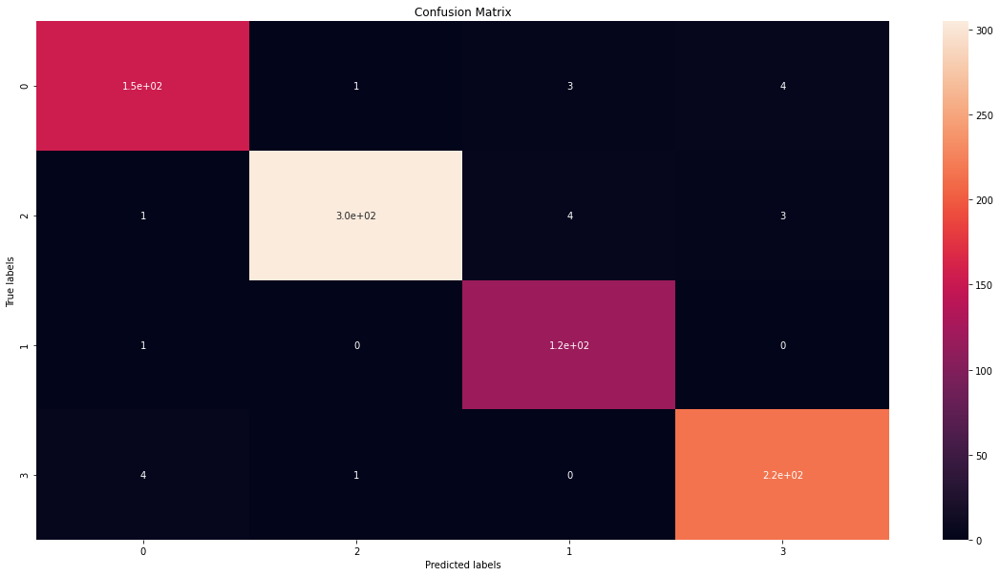

In [97]:
plt.figure(figsize=(20,10))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax)  #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(pd.unique(y_test.values.ravel()))
ax.yaxis.set_ticklabels(pd.unique(y_test.values.ravel()))

In [98]:
print(classification_report(y_test, y_pred_gb))

              precision    recall  f1-score   support

           0       0.96      0.95      0.96       162
           1       0.99      0.97      0.98       313
           2       0.94      0.99      0.97       120
           3       0.97      0.98      0.97       220

    accuracy                           0.97       815
   macro avg       0.97      0.97      0.97       815
weighted avg       0.97      0.97      0.97       815



In [99]:
report = classification_report(y_test, y_pred_gb, output_dict=True)

df_report = pd.DataFrame(report).transpose()

dfi.export(df_report, 'agg_gradient_boosting.png')

# XGBOOST

In [100]:
import xgboost as xgb

training_loss = []
test_loss = []

def tree_scores(i):
    clf_xgb = xgb.XGBClassifier( max_depth=i, random_state = 42, n_jobs = 4, verbose = 0)
    
    
    clf_xgb.fit(X_train, y_train.values.ravel())
    y_pred_xgb = clf_xgb.predict_proba(X_test)
    y_pred_train_xgb = clf_xgb.predict_proba(X_train)
    
     
    print('Max Depth:' ,i)    
    print('Training set score: {:.4f}'.format(clf_xgb.score(X_train, y_train)))
    training_loss.append(log_loss(y_train, y_pred_train_xgb))

    print('Test set score: {:.4f}'.format(clf_xgb.score(X_test, y_test)))
    test_loss.append(log_loss(y_test, y_pred_xgb))
     
        
for i in range(1,11):
    tree_scores(i)

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[13:25:34] WARNING: xgboost/src/learner.cc:541: 
Parameters: { verbose } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[13:25:34] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Max Depth: 1
Training set score: 0.9776
Test set score: 0.9595
[13:25:35] WARNING: xgboost/src/learner.cc:541: 
Parameters: { verbose } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[13:25:35] WARN

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



Max Depth: 2
Training set score: 0.9946
Test set score: 0.9767
[13:25:35] WARNING: xgboost/src/learner.cc:541: 
Parameters: { verbose } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[13:25:35] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



Max Depth: 3
Training set score: 1.0000
Test set score: 0.9804
[13:25:36] WARNING: xgboost/src/learner.cc:541: 
Parameters: { verbose } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[13:25:36] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



Max Depth: 4
Training set score: 1.0000
Test set score: 0.9828
[13:25:37] WARNING: xgboost/src/learner.cc:541: 
Parameters: { verbose } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[13:25:37] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



Max Depth: 5
Training set score: 1.0000
Test set score: 0.9828
[13:25:38] WARNING: xgboost/src/learner.cc:541: 
Parameters: { verbose } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[13:25:38] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



Max Depth: 6
Training set score: 1.0000
Test set score: 0.9865
[13:25:39] WARNING: xgboost/src/learner.cc:541: 
Parameters: { verbose } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[13:25:39] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



Max Depth: 7
Training set score: 1.0000
Test set score: 0.9816
[13:25:40] WARNING: xgboost/src/learner.cc:541: 
Parameters: { verbose } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[13:25:40] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



Max Depth: 8
Training set score: 1.0000
Test set score: 0.9840
[13:25:44] WARNING: xgboost/src/learner.cc:541: 
Parameters: { verbose } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[13:25:44] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



Max Depth: 9
Training set score: 1.0000
Test set score: 0.9840
[13:25:47] WARNING: xgboost/src/learner.cc:541: 
Parameters: { verbose } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[13:25:47] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



Max Depth: 10
Training set score: 1.0000
Test set score: 0.9840


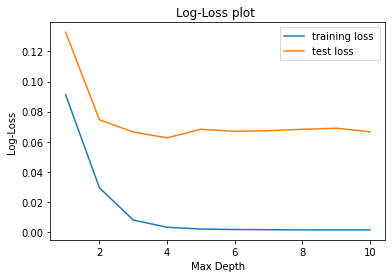

In [101]:
y = [1,2,3,4,5,6,7,8,9,10]

# plotting the line 1 points 
plt.plot(y, training_loss, label = "training loss ")

# plotting the line 2 points 
plt.plot(y, test_loss, label = "test loss ")
plt.xlabel('Max Depth')
# Set the y axis label of the current axis.
plt.ylabel('Log-Loss')
# Set a title of the current axes.
plt.title('Log-Loss plot ')
# show a legend on the plot
plt.legend()
# Display a figure.
plt.show()

In [102]:
parameters = {'max_depth':range(1,11)}
clf = GridSearchCV(xgb.XGBClassifier( max_depth=i, random_state = 42),  parameters, n_jobs=4)
clf.fit(X=X_train, y=y_train.values.ravel())
tree_model = clf.best_estimator_
print (clf.best_score_, clf.best_params_) 

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[13:27:11] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
0.987190990990991 {'max_depth': 5}


In [103]:
clf_xgb = xgb.XGBClassifier( max_depth=3, random_state = 42, n_jobs = 4)

print('Cross-Validation Score:',np.mean(cross_val_score(clf_xgb, X_train, y_train.values.ravel(), cv=10)))

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[13:27:26] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[13:27:28] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[13:27:29] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[13:27:30] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd li

In [269]:
clf_xgb = xgb.XGBClassifier( max_depth=3, random_state = 42, n_jobs = 4)

clf_xgb.fit(X_train, y_train.values.ravel())

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[17:27:13] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=4, num_parallel_tree=1,
              objective='multi:softprob', random_state=42, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [270]:
y_pred_xgb = clf_xgb.predict(X_test)

In [271]:
# print the scores on training and test set

print('Training set score: {:.4f}'.format(clf_xgb.score(X_train, y_train)))

print('Test set score: {:.4f}'.format(clf_xgb.score(X_test, y_test)))

Training set score: 1.0000
Test set score: 0.9804


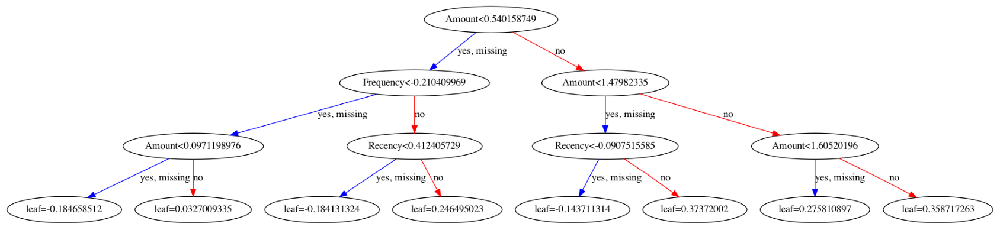

In [272]:
fig, ax = plt.subplots(figsize=(30, 30))
xgb.plot_tree(clf_xgb, num_trees=4, ax=ax)
plt.show()

In [273]:
cm = confusion_matrix(y_test, y_pred_xgb)

print('Confusion matrix\n\n', cm)

Confusion matrix

 [[159   1   1   1]
 [  1 309   1   2]
 [  1   2 117   0]
 [  5   1   0 214]]


[Text(0, 0.5, '0'), Text(0, 1.5, '2'), Text(0, 2.5, '1'), Text(0, 3.5, '3')]

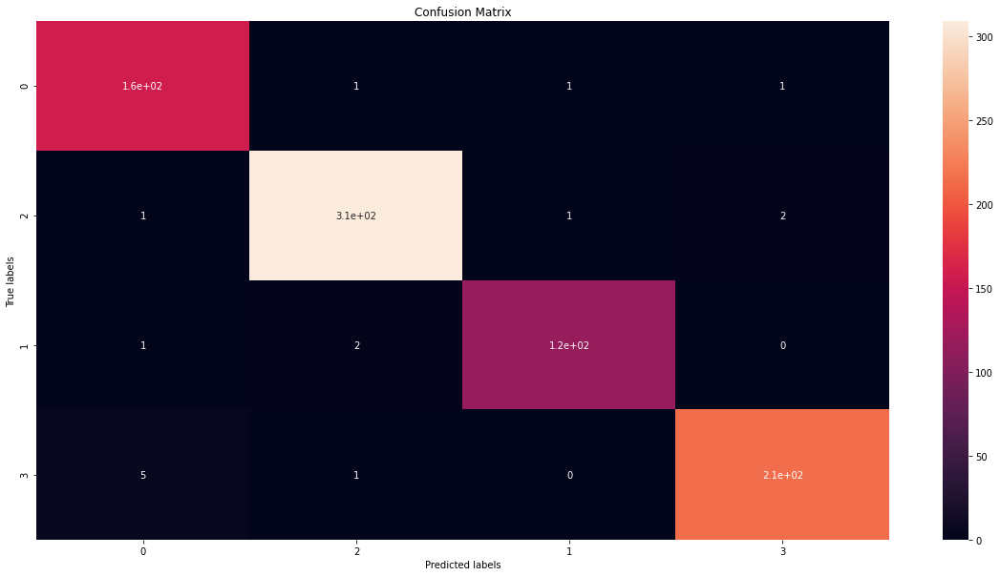

In [274]:
plt.figure(figsize=(20,10))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax)  #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(pd.unique(y_test.values.ravel()))
ax.yaxis.set_ticklabels(pd.unique(y_test.values.ravel()))

In [275]:
print(classification_report(y_test, y_pred_xgb))

              precision    recall  f1-score   support

           0       0.96      0.98      0.97       162
           1       0.99      0.99      0.99       313
           2       0.98      0.97      0.98       120
           3       0.99      0.97      0.98       220

    accuracy                           0.98       815
   macro avg       0.98      0.98      0.98       815
weighted avg       0.98      0.98      0.98       815



In [276]:
report = classification_report(y_test, y_pred_xgb, output_dict=True)

df_report = pd.DataFrame(report).transpose()

dfi.export(df_report, 'agg_xgb.png')

<h3 id="DBSCAN_Dataset">
3.2 DBSCAN Dataset
<a class="anchor-link" href="https://www.kaggle.com/johnmantios/travel-review-ratings-dataset/edit/run/47115230#DBSCAN_Dataset">¶</a>
</h3>

### 3.2.1 Decision Tree

In [242]:
RFM_DB_filtered.describe()

,Frequency,Amount,Recency,DBLabels
count,3328.000000,3328.000000,3328.000000,3328.000000
mean,-0.229556,-0.278613,-0.038933,0.035757
std,0.850755,0.647022,1.005680,0.279951
min,-1.265897,-0.905481,-1.175814,0.000000
25%,-0.889532,-0.799491,-0.963869,0.000000
50%,-0.444737,-0.472699,-0.332644,0.000000
75%,0.239564,0.043242,0.763936,0.000000
max,2.600401,2.668588,2.224508,3.000000


In [243]:
RFM_DB_filtered.drop_duplicates()

,Frequency,Amount,Recency,DBLabels
0,-0.136801,-0.343723,0.321618,0
1,0.444854,0.434165,-0.830252,0
2,-0.718457,-0.604882,0.252506,0
3,-0.581597,-0.721754,0.551992,0
4,2.224036,1.164892,-1.009944,0
...,...,...,...,...
4070,-0.718457,-0.684149,-0.346467,0
4071,-0.889532,-0.259715,-1.143561,0
4072,-0.342092,-0.553931,0.810011,0
4073,-0.889532,-0.271298,1.865124,0


In [244]:
for col in RFM_DB_filtered.columns:
    print(RFM_DB_filtered[col].value_counts())

-1.265897    117
-0.923747     86
-1.094822     85
-0.957962     78
-0.992177     76
            ... 
 2.189821      3
 2.360896      2
 2.326681      2
 2.224036      2
 2.600401      1
Name: Frequency, Length: 111, dtype: int64
-0.905481    367
-0.887498      7
-0.901778      5
-0.879035      5
-0.875509      4
            ... 
-0.239510      1
-0.273431      1
-0.294764      1
-0.047374      1
-0.163611      1
Name: Amount, Length: 2819, dtype: int64
-1.157384    36
-1.097486    36
-1.129739    33
-1.161991    30
-1.092879    29
             ..
 0.446020     1
 0.376908     1
 1.385946     1
 2.063246     1
 0.856086     1
Name: Recency, Length: 572, dtype: int64
0    3264
1      27
2      19
3      18
Name: DBLabels, dtype: int64


In [277]:
X = RFM_DB_filtered.drop(['DBLabels'], axis = 1)
y = RFM_DB_filtered['DBLabels']

In [278]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 42, stratify=y)

In [279]:
print(y_test.value_counts()) #we secured the 20% in the classes represenation

0    653
1      5
3      4
2      4
Name: DBLabels, dtype: int64


In [280]:
sm = SMOTE(random_state = 42)
           
X_train, y_train = sm.fit_sample(X_train, y_train) 

In [281]:
print(y_train.value_counts())

3    2611
2    2611
1    2611
0    2611
Name: DBLabels, dtype: int64


# GINI CRITERION

In [250]:
training_scores = []
test_scores = []

def tree_scores(i):
    clf_gini = DecisionTreeClassifier(criterion='gini', max_depth=i, random_state = 42)
    
    
    clf_gini.fit(X_train, y_train)
    y_pred_gini = clf_gini.predict_proba(X_test)
    y_pred_train_gini = clf_gini.predict_proba(X_train)
    
     
    print('Max Depth:' ,i)    
    print('Training set score: {:.4f}'.format(clf_gini.score(X_train, y_train)))
    training_scores.append(log_loss(y_train, y_pred_train_gini))

    print('Test set score: {:.4f}'.format(clf_gini.score(X_test, y_test)))
    test_scores.append(log_loss(y_test, y_pred_gini))
     
        
for i in range(1,11):
    tree_scores(i)

Max Depth: 1
Training set score: 0.5000
Test set score: 0.9880
Max Depth: 2
Training set score: 0.7500
Test set score: 0.0165
Max Depth: 3
Training set score: 0.9669
Test set score: 0.8544
Max Depth: 4
Training set score: 0.9987
Test set score: 0.9955
Max Depth: 5
Training set score: 0.9998
Test set score: 0.9955
Max Depth: 6
Training set score: 0.9999
Test set score: 0.9955
Max Depth: 7
Training set score: 1.0000
Test set score: 0.9940
Max Depth: 8
Training set score: 1.0000
Test set score: 0.9940
Max Depth: 9
Training set score: 1.0000
Test set score: 0.9940
Max Depth: 10
Training set score: 1.0000
Test set score: 0.9940


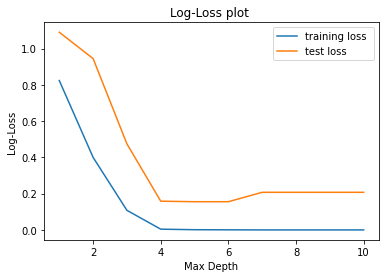

In [251]:
y = [1,2,3,4,5,6,7,8,9,10]

# plotting the line 1 points 
plt.plot(y, training_scores, label = "training loss ")

# plotting the line 2 points 
plt.plot(y, test_scores, label = "test loss ")
plt.xlabel('Max Depth')
# Set the y axis label of the current axis.
plt.ylabel('Log-Loss')
# Set a title of the current axes.
plt.title('Log-Loss plot ')
# show a legend on the plot
plt.legend()
# Display a figure.
plt.show()

In [252]:
from sklearn.model_selection import GridSearchCV

parameters = {'max_depth':range(1,11)}
clf = GridSearchCV(DecisionTreeClassifier(criterion='gini', random_state = 42),  parameters, n_jobs=4)
clf.fit(X=X_train, y=y_train)
tree_model = clf.best_estimator_
print (clf.best_score_, clf.best_params_) 

0.9996169957944276 {'max_depth': 5}


In [253]:
clf_gini = DecisionTreeClassifier(criterion='gini', max_depth=4, random_state = 42)

print('Cross-Validation Score:',np.mean(cross_val_score(clf_gini, X_train, y_train, cv=10)))

Cross-Validation Score: 0.9983724724559572


In [254]:
clf_gini = DecisionTreeClassifier(criterion='gini', max_depth=4, random_state = 42)

clf_gini.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=4, random_state=42)

In [255]:
y_pred_gini = clf_gini.predict(X_test)

In [256]:
print('Training set score: {:.4f}'.format(clf_gini.score(X_train, y_train)))

print('Test set score: {:.4f}'.format(clf_gini.score(X_test, y_test)))

Training set score: 0.9987
Test set score: 0.9955


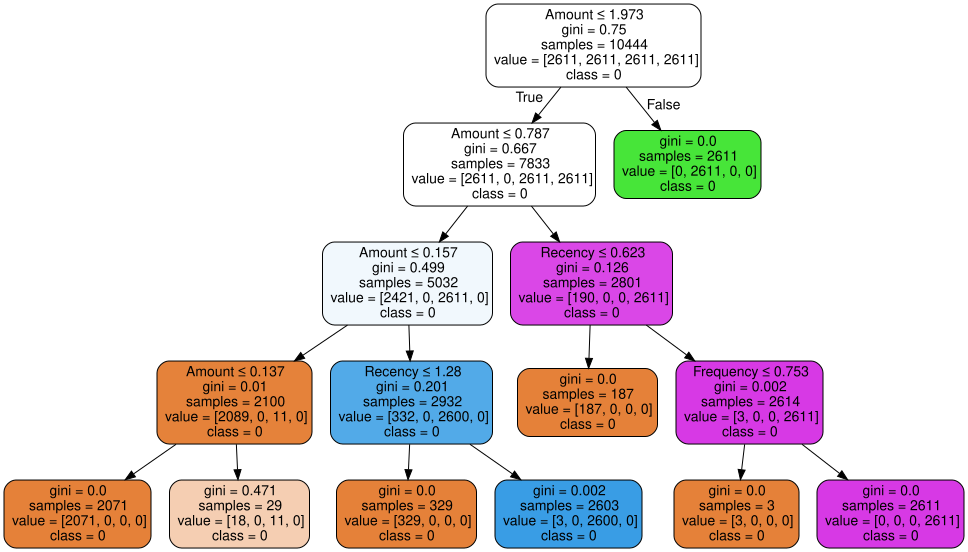

In [257]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import graphviz
from sklearn import tree



dot_data = tree.export_graphviz(clf_gini, out_file=None, 
                              feature_names=X_train.columns,  
                              class_names=y_train.apply(str),  
                              filled=True, rounded=True,  
                              special_characters=True)

graph = graphviz.Source(dot_data) 

graph 

In [258]:
cf_matrix = confusion_matrix(y_test, y_pred_gini)

cf_matrix

array([[653,   0,   0,   0],
       [  0,   5,   0,   0],
       [  1,   0,   3,   0],
       [  2,   0,   0,   2]])

[Text(0, 0.5, '0'), Text(0, 1.5, '2'), Text(0, 2.5, '1'), Text(0, 3.5, '3')]

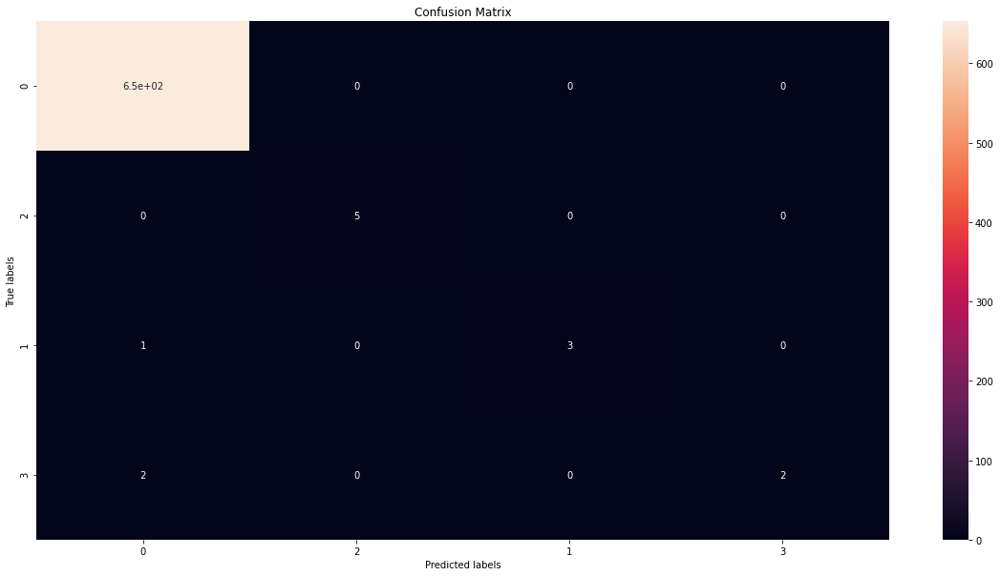

In [259]:
plt.figure(figsize=(20,10))
ax= plt.subplot()
sns.heatmap(cf_matrix, annot=True, ax = ax)  #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(y_test.unique())
ax.yaxis.set_ticklabels(y_test.unique())

In [260]:
print(classification_report(y_test, y_pred_gini))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       653
           1       1.00      1.00      1.00         5
           2       1.00      0.75      0.86         4
           3       1.00      0.50      0.67         4

    accuracy                           1.00       666
   macro avg       1.00      0.81      0.88       666
weighted avg       1.00      1.00      0.99       666



In [261]:
report = classification_report(y_test, y_pred_gini, output_dict=True)

df_report = pd.DataFrame(report).transpose()

dfi.export(df_report, 'db_gini.png')

# ENTROPY CRITERION

In [282]:
training_loss = []
test_loss = []

def tree_scores(i):
    clf_en = DecisionTreeClassifier(criterion='entropy', max_depth=i, random_state = 42)
    
    
    clf_en.fit(X_train, y_train)
    y_pred_en = clf_en.predict_proba(X_test)
    y_pred_train_en = clf_en.predict_proba(X_train)
    
     
    print('Max Depth:' ,i)    
    print('Training set score: {:.4f}'.format(clf_en.score(X_train, y_train)))
    training_loss.append(log_loss(y_train, y_pred_train_en))

    print('Test set score: {:.4f}'.format(clf_en.score(X_test, y_test)))
    test_loss.append(log_loss(y_test, y_pred_en))
     
        
for i in range(1,11):
    tree_scores(i)

Max Depth: 1
Training set score: 0.5000
Test set score: 0.0120
Max Depth: 2
Training set score: 0.9483
Test set score: 0.7898
Max Depth: 3
Training set score: 0.9993
Test set score: 0.9940
Max Depth: 4
Training set score: 0.9998
Test set score: 0.9955
Max Depth: 5
Training set score: 0.9998
Test set score: 0.9955
Max Depth: 6
Training set score: 0.9999
Test set score: 0.9955
Max Depth: 7
Training set score: 1.0000
Test set score: 0.9940
Max Depth: 8
Training set score: 1.0000
Test set score: 0.9940
Max Depth: 9
Training set score: 1.0000
Test set score: 0.9940
Max Depth: 10
Training set score: 1.0000
Test set score: 0.9940


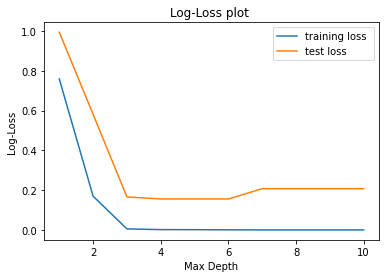

In [283]:
y = [1,2,3,4,5,6,7,8,9,10]

# plotting the line 1 points 
plt.plot(y, training_loss, label = "training loss ")

# plotting the line 2 points 
plt.plot(y, test_loss, label = "test loss ")
plt.xlabel('Max Depth')
# Set the y axis label of the current axis.
plt.ylabel('Log-Loss')
# Set a title of the current axes.
plt.title('Log-Loss plot ')
# show a legend on the plot
plt.legend()
# Display a figure.
plt.show()

In [284]:
parameters = {'max_depth':range(1,11)}
clf = GridSearchCV(DecisionTreeClassifier(criterion='entropy', random_state = 42),  parameters, n_jobs=4)
clf.fit(X=X_train, y=y_train)
tree_model = clf.best_estimator_
print (clf.best_score_, clf.best_params_) 

0.9995212103538147 {'max_depth': 4}


In [285]:
clf_en = DecisionTreeClassifier(criterion='entropy', max_depth=3, random_state = 42)

print('Cross-Validation Score:',np.mean(cross_val_score(clf_en, X_train, y_train, cv=10)))

Cross-Validation Score: 0.9991383893380265


In [286]:
clf_en = DecisionTreeClassifier(criterion='entropy', max_depth=3, random_state = 42)

clf_en.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=3, random_state=42)

In [287]:
y_pred_en = clf_en.predict(X_test)

In [288]:
# print the scores on training and test set

print('Training set score: {:.4f}'.format(clf_en.score(X_train, y_train)))

print('Test set score: {:.4f}'.format(clf_en.score(X_test, y_test)))

Training set score: 0.9993
Test set score: 0.9940


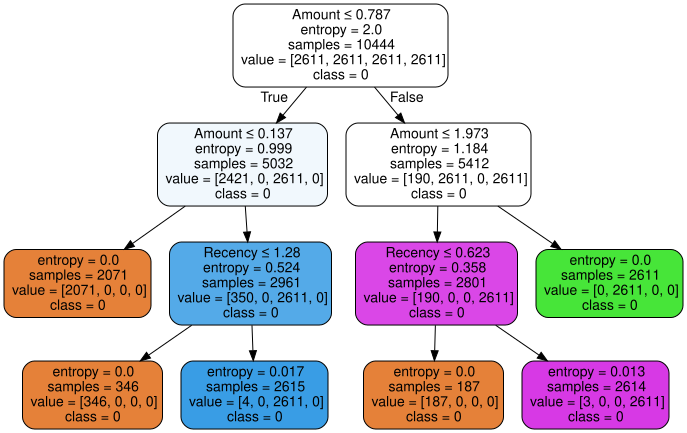

In [289]:
dot_data = tree.export_graphviz(clf_en, out_file=None, 
                              feature_names=X_train.columns,  
                              class_names=y_train.apply(str),  
                              filled=True, rounded=True,  
                              special_characters=True)

graph = graphviz.Source(dot_data) 

graph 

In [290]:
cm = confusion_matrix(y_test, y_pred_en)

print('Confusion matrix\n\n', cm)

Confusion matrix

 [[652   0   0   1]
 [  0   5   0   0]
 [  0   0   3   1]
 [  2   0   0   2]]


[Text(0, 0.5, '0'), Text(0, 1.5, '2'), Text(0, 2.5, '1'), Text(0, 3.5, '3')]

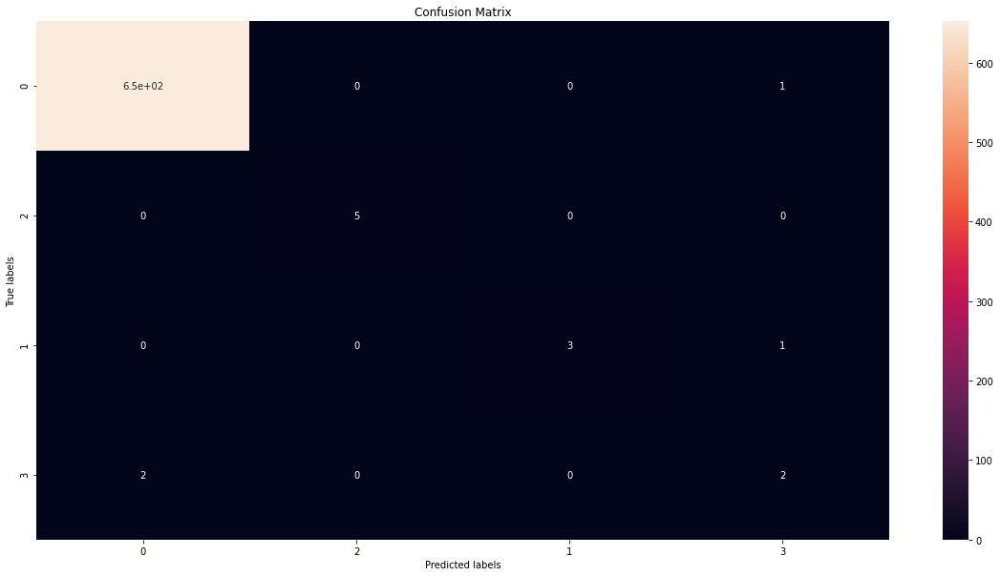

In [291]:
plt.figure(figsize=(20,10))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax)  #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(y_test.unique())
ax.yaxis.set_ticklabels(y_test.unique())

In [292]:
print(classification_report(y_test, y_pred_en))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       653
           1       1.00      1.00      1.00         5
           2       1.00      0.75      0.86         4
           3       0.50      0.50      0.50         4

    accuracy                           0.99       666
   macro avg       0.87      0.81      0.84       666
weighted avg       0.99      0.99      0.99       666



In [293]:
report = classification_report(y_test, y_pred_en, output_dict=True)

df_report = pd.DataFrame(report).transpose()

dfi.export(df_report, 'db_entropy.png')

# GRADIENT BOOSTING

In [294]:
from sklearn.ensemble import GradientBoostingClassifier

training_loss = []
test_loss = []

def tree_scores(i):
    clf_gb = GradientBoostingClassifier( max_depth=i, random_state = 42)
    
    
    clf_gb.fit(X_train, y_train.values.ravel())
    y_pred_gb = clf_gb.predict_proba(X_test)
    y_pred_train_gb = clf_gb.predict_proba(X_train)
    
     
    print('Max Depth:' ,i)    
    print('Training set score: {:.4f}'.format(clf_gb.score(X_train, y_train)))
    training_loss.append(log_loss(y_train, y_pred_train_gb))

    print('Test set score: {:.4f}'.format(clf_gb.score(X_test, y_test)))
    test_loss.append(log_loss(y_test, y_pred_gb))
     
        
for i in range(1,11):
    tree_scores(i)

Max Depth: 1
Training set score: 0.9994
Test set score: 0.9970
Max Depth: 2
Training set score: 1.0000
Test set score: 0.9970
Max Depth: 3
Training set score: 1.0000
Test set score: 0.9970
Max Depth: 4
Training set score: 1.0000
Test set score: 0.9985
Max Depth: 5
Training set score: 1.0000
Test set score: 0.9970
Max Depth: 6
Training set score: 1.0000
Test set score: 0.9970
Max Depth: 7
Training set score: 1.0000
Test set score: 0.9955
Max Depth: 8
Training set score: 1.0000
Test set score: 0.9955
Max Depth: 9
Training set score: 1.0000
Test set score: 0.9955
Max Depth: 10
Training set score: 1.0000
Test set score: 0.9940


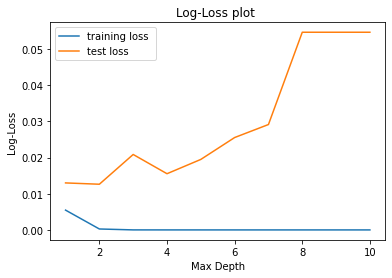

In [295]:
y = [1,2,3,4,5,6,7,8,9,10]

# plotting the line 1 points 
plt.plot(y, training_loss, label = "training loss ")

# plotting the line 2 points 
plt.plot(y, test_loss, label = "test loss ")
plt.xlabel('Max Depth')
# Set the y axis label of the current axis.
plt.ylabel('Log-Loss')
# Set a title of the current axes.
plt.title('Log-Loss plot ')
# show a legend on the plot
plt.legend()
# Display a figure.
plt.show()

In [257]:
parameters = {'max_depth':range(1,11)}
clf = GridSearchCV(GradientBoostingClassifier( max_depth=i, random_state = 42),  parameters, n_jobs=4)
clf.fit(X=X_train, y=y_train.values.ravel())
tree_model = clf.best_estimator_
print (clf.best_score_, clf.best_params_) 

GridSearchCV(estimator=GradientBoostingClassifier(max_depth=10,
                                                  random_state=42),
             n_jobs=4, param_grid={'max_depth': range(1, 11)})

0.9985576749326794 {'max_depth': 3}


In [258]:
clf_gb = GradientBoostingClassifier( max_depth=8, random_state = 42)

print('Cross-Validation Score:',np.mean(cross_val_score(clf_gb, X_train, y_train.values.ravel(), cv=10)))

KeyboardInterrupt: 

In [296]:
clf_gb = GradientBoostingClassifier( max_depth=4, random_state = 42)

clf_gb.fit(X_train, y_train.values.ravel())

GradientBoostingClassifier(max_depth=4, random_state=42)

In [297]:
y_pred_gb = clf_gb.predict(X_test)

In [298]:
# print the scores on training and test set

print('Training set score: {:.4f}'.format(clf_gb.score(X_train, y_train)))

print('Test set score: {:.4f}'.format(clf_gb.score(X_test, y_test)))

Training set score: 1.0000
Test set score: 0.9985


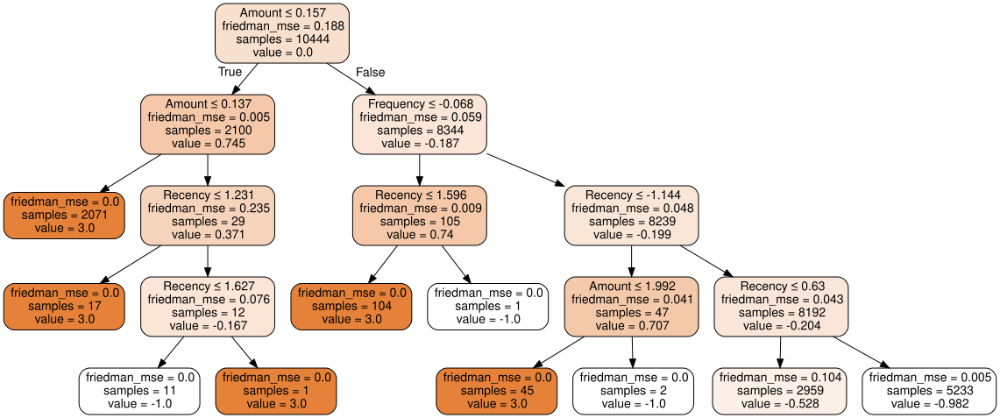

In [299]:
dot_data = tree.export_graphviz(clf_gb.estimators_[0, 0], out_file=None, 
                              feature_names=X_train.columns,  
                              class_names=y_train.apply(str),  
                              filled=True, rounded=True,  
                              special_characters=True)

graph = graphviz.Source(dot_data) 

graph 

In [300]:
cm = confusion_matrix(y_test, y_pred_gb)

print('Confusion matrix\n\n', cm)

Confusion matrix

 [[653   0   0   0]
 [  0   5   0   0]
 [  0   0   4   0]
 [  1   0   0   3]]


[Text(0, 0.5, '0'), Text(0, 1.5, '2'), Text(0, 2.5, '1'), Text(0, 3.5, '3')]

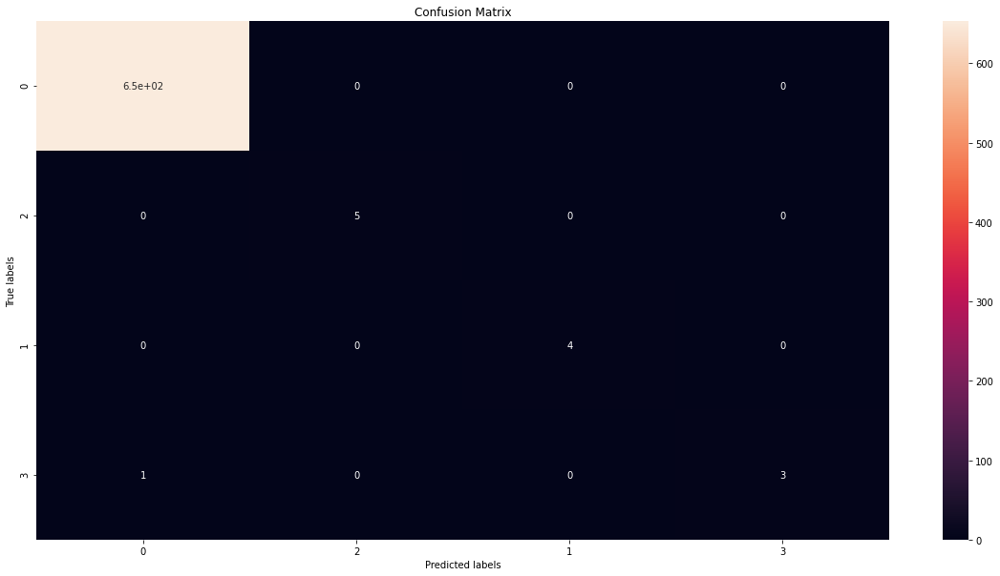

In [301]:
plt.figure(figsize=(20,10))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax)  #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(pd.unique(y_test.values.ravel()))
ax.yaxis.set_ticklabels(pd.unique(y_test.values.ravel()))

In [302]:
print(classification_report(y_test, y_pred_gb))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       653
           1       1.00      1.00      1.00         5
           2       1.00      1.00      1.00         4
           3       1.00      0.75      0.86         4

    accuracy                           1.00       666
   macro avg       1.00      0.94      0.96       666
weighted avg       1.00      1.00      1.00       666



In [303]:
report = classification_report(y_test, y_pred_gb, output_dict=True)

df_report = pd.DataFrame(report).transpose()

dfi.export(df_report, 'db_gb.png')

# XGBOOST

In [304]:
training_loss = []
test_loss = []

def tree_scores(i):
    clf_xgb = xgb.XGBClassifier( max_depth=i, random_state = 42, n_jobs = 4)
    
    
    clf_xgb.fit(X_train, y_train.values.ravel())
    y_pred_xgb = clf_xgb.predict_proba(X_test)
    y_pred_train_xgb = clf_xgb.predict_proba(X_train)
    
     
    print('Max Depth:' ,i)    
    print('Training set score: {:.4f}'.format(clf_xgb.score(X_train, y_train)))
    training_loss.append(log_loss(y_train, y_pred_train_xgb))

    print('Test set score: {:.4f}'.format(clf_xgb.score(X_test, y_test)))
    test_loss.append(log_loss(y_test, y_pred_xgb))
     
        
for i in range(1,11):
    tree_scores(i)

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[18:16:24] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Max Depth: 1
Training set score: 0.9998
Test set score: 0.9970
[18:16:24] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



Max Depth: 2
Training set score: 1.0000
Test set score: 0.9970
[18:16:25] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



Max Depth: 3
Training set score: 1.0000
Test set score: 0.9985
[18:16:27] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



Max Depth: 4
Training set score: 1.0000
Test set score: 0.9985
[18:16:29] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



Max Depth: 5
Training set score: 1.0000
Test set score: 0.9985
[18:16:31] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



Max Depth: 6
Training set score: 1.0000
Test set score: 0.9985
[18:16:32] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



Max Depth: 7
Training set score: 1.0000
Test set score: 0.9985
[18:16:33] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



Max Depth: 8
Training set score: 1.0000
Test set score: 0.9985
[18:16:34] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



Max Depth: 9
Training set score: 1.0000
Test set score: 0.9985
[18:16:35] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



Max Depth: 10
Training set score: 1.0000
Test set score: 0.9985


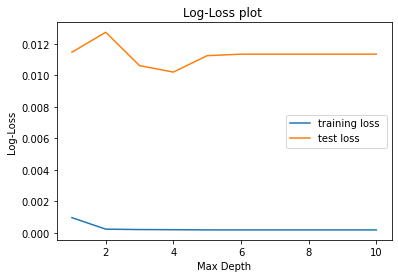

In [305]:
y = [1,2,3,4,5,6,7,8,9,10]

# plotting the line 1 points 
plt.plot(y, training_loss, label = "training loss ")

# plotting the line 2 points 
plt.plot(y, test_loss, label = "test loss ")
plt.xlabel('Max Depth')
# Set the y axis label of the current axis.
plt.ylabel('Log-Loss')
# Set a title of the current axes.
plt.title('Log-Loss plot ')
# show a legend on the plot
plt.legend()
# Display a figure.
plt.show()

In [306]:
parameters = {'max_depth':range(1,11)}
clf = GridSearchCV(xgb.XGBClassifier( max_depth=i, random_state = 42),  parameters, n_jobs=4)
clf.fit(X=X_train, y=y_train.values.ravel())
tree_model = clf.best_estimator_
print (clf.best_score_, clf.best_params_) 

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[18:17:45] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
0.9998084749710673 {'max_depth': 6}


In [307]:
clf_xgb = xgb.XGBClassifier( max_depth=4, random_state = 42, n_jobs = 4)

print('Cross-Validation Score:',np.mean(cross_val_score(clf_xgb, X_train, y_train.values.ravel(), cv=10)))

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[18:19:25] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[18:19:27] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[18:19:28] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[18:19:28] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd li

In [308]:
clf_xgb = xgb.XGBClassifier( max_depth=4, random_state = 42, n_jobs = 4)

clf_xgb.fit(X_train, y_train.values.ravel())

[18:19:41] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=4,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=4, num_parallel_tree=1,
              objective='multi:softprob', random_state=42, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [309]:
y_pred_xgb = clf_xgb.predict(X_test)

In [310]:
# print the scores on training and test set

print('Training set score: {:.4f}'.format(clf_xgb.score(X_train, y_train)))

print('Test set score: {:.4f}'.format(clf_xgb.score(X_test, y_test)))

Training set score: 1.0000
Test set score: 0.9985


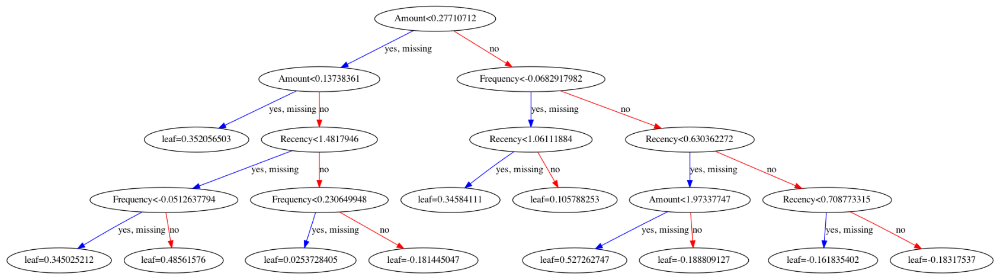

In [311]:
fig, ax = plt.subplots(figsize=(30, 30))
xgb.plot_tree(clf_xgb, num_trees=4, ax=ax)
plt.show()

In [312]:
cm = confusion_matrix(y_test, y_pred_xgb)

print('Confusion matrix\n\n', cm)

Confusion matrix

 [[653   0   0   0]
 [  0   5   0   0]
 [  0   0   4   0]
 [  1   0   0   3]]


[Text(0, 0.5, '0'), Text(0, 1.5, '2'), Text(0, 2.5, '1'), Text(0, 3.5, '3')]

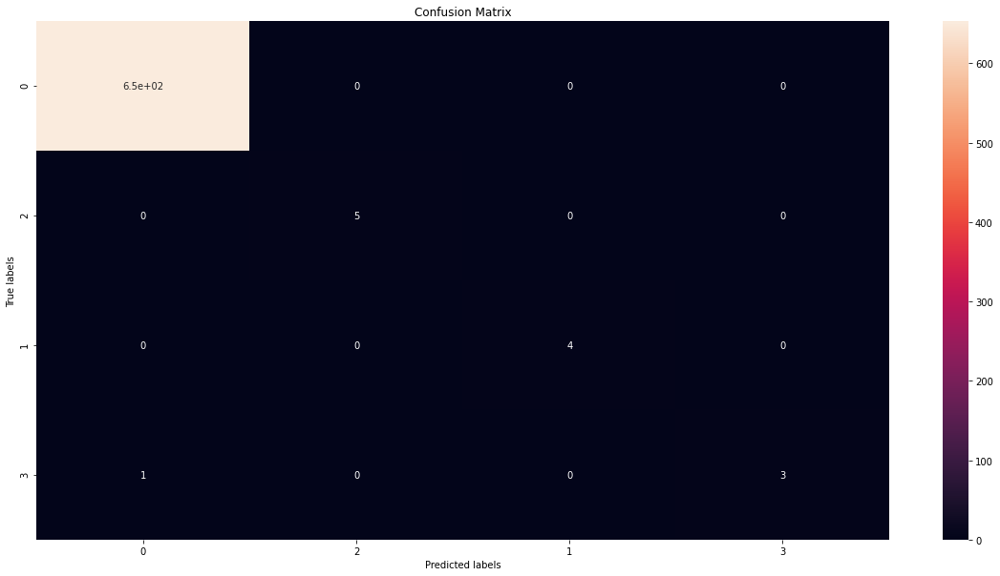

In [313]:
plt.figure(figsize=(20,10))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax)  #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(pd.unique(y_test.values.ravel()))
ax.yaxis.set_ticklabels(pd.unique(y_test.values.ravel()))

In [314]:
print(classification_report(y_test, y_pred_xgb))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       653
           1       1.00      1.00      1.00         5
           2       1.00      1.00      1.00         4
           3       1.00      0.75      0.86         4

    accuracy                           1.00       666
   macro avg       1.00      0.94      0.96       666
weighted avg       1.00      1.00      1.00       666



In [315]:
report = classification_report(y_test, y_pred_xgb, output_dict=True)

df_report = pd.DataFrame(report).transpose()

dfi.export(df_report, 'db_xgb.png')

<h3 id="EM-GMM_Dataset">
3.3 EM-GMM Dataset
<a class="anchor-link" href="https://www.kaggle.com/johnmantios/travel-review-ratings-dataset/edit/run/47115230#EM-GMM_Dataset">¶</a>
</h3>

### 3.3.1 Decision Tree

In [35]:
RFM_gmm.describe()

,Frequency,Amount,Recency,gmm
count,4.075000e+03,4.075000e+03,4.075000e+03,4075.000000
mean,1.046198e-16,6.756695e-17,1.394931e-17,2.516074
std,1.000123e+00,1.000123e+00,1.000123e+00,1.638373
min,-1.265897e+00,-9.054806e-01,-1.175814e+00,0.000000
25%,-8.211020e-01,-7.604353e-01,-9.362245e-01,1.000000
50%,-2.736615e-01,-3.322284e-01,-2.312798e-01,3.000000
75%,6.501444e-01,4.094029e-01,7.685438e-01,4.000000
max,2.600401e+00,4.398553e+00,2.224508e+00,5.000000


In [36]:
RFM_gmm.drop_duplicates()

,Frequency,Amount,Recency,gmm
0,-0.136801,-0.343723,0.321618,1
1,0.444854,0.434165,-0.830252,5
2,-0.718457,-0.604882,0.252506,1
3,-0.581597,-0.721754,0.551992,1
4,2.224036,1.164892,-1.009944,5
...,...,...,...,...
4070,-0.718457,-0.684149,-0.346467,3
4071,-0.889532,-0.259715,-1.143561,2
4072,-0.342092,-0.553931,0.810011,1
4073,-0.889532,-0.271298,1.865124,1


In [37]:
for col in RFM_gmm.columns:
    print(RFM_gmm[col].value_counts())

-1.265897    118
-0.923747     87
-1.094822     85
-0.992177     80
-0.957962     80
            ... 
 2.292466     10
 2.224036     10
 2.360896      8
 2.429326      7
 2.600401      7
Name: Frequency, Length: 114, dtype: int64
-0.905481    403
-0.887498      7
-0.901778      6
-0.879035      5
-0.870572      5
            ... 
-0.279602      1
 0.296454      1
-0.564086      1
 1.143506      1
-0.040551      1
Name: Amount, Length: 3525, dtype: int64
-1.157384    39
-1.097486    37
-1.129739    34
-1.143561    32
-1.125131    31
             ..
 1.588676     1
 1.155572     1
 2.063246     1
 0.137319     1
-0.023943     1
Name: Recency, Length: 588, dtype: int64
1    1081
3     775
5     697
4     566
2     549
0     407
Name: gmm, dtype: int64


In [38]:
X = RFM_gmm.drop(['gmm'], axis = 1)
y = RFM_gmm['gmm']

In [40]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 42, stratify=y)

In [41]:
print(y_test.value_counts()) #we secured the 20% in the classes represenation

1    216
3    155
5    139
4    113
2    110
0     82
Name: gmm, dtype: int64


In [43]:
from imblearn.over_sampling import SMOTE

sm = SMOTE(random_state = 42)
           
X_train, y_train = sm.fit_sample(X_train, y_train) 

In [44]:
print(y_train.value_counts())

3    865
2    865
5    865
1    865
4    865
0    865
Name: gmm, dtype: int64


# GINI CRITERION

In [324]:
training_scores = []
test_scores = []

def tree_scores(i):
    clf_gini = DecisionTreeClassifier(criterion='gini', max_depth=i, random_state = 42)
    
    
    clf_gini.fit(X_train, y_train)
    y_pred_gini = clf_gini.predict_proba(X_test)
    y_pred_train_gini = clf_gini.predict_proba(X_train)
    
     
    print('Max Depth:' ,i)    
    print('Training set score: {:.4f}'.format(clf_gini.score(X_train, y_train)))
    training_scores.append(log_loss(y_train, y_pred_train_gini))

    print('Test set score: {:.4f}'.format(clf_gini.score(X_test, y_test)))
    test_scores.append(log_loss(y_test, y_pred_gini))
     
        
for i in range(1,11):
    tree_scores(i)

Max Depth: 1
Training set score: 0.3303
Test set score: 0.2736
Max Depth: 2
Training set score: 0.6131
Test set score: 0.5092
Max Depth: 3
Training set score: 0.8233
Test set score: 0.8294
Max Depth: 4
Training set score: 0.9299
Test set score: 0.9141
Max Depth: 5
Training set score: 0.9457
Test set score: 0.9239
Max Depth: 6
Training set score: 0.9671
Test set score: 0.9423
Max Depth: 7
Training set score: 0.9798
Test set score: 0.9595
Max Depth: 8
Training set score: 0.9886
Test set score: 0.9644
Max Depth: 9
Training set score: 0.9933
Test set score: 0.9656
Max Depth: 10
Training set score: 0.9969
Test set score: 0.9656


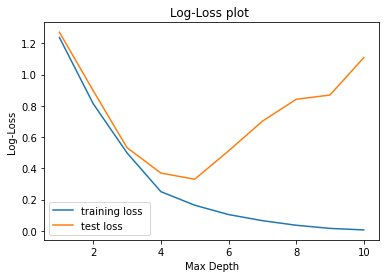

In [325]:
y = [1,2,3,4,5,6,7,8,9,10]

# plotting the line 1 points 
plt.plot(y, training_scores, label = "training loss ")

# plotting the line 2 points 
plt.plot(y, test_scores, label = "test loss ")
plt.xlabel('Max Depth')
# Set the y axis label of the current axis.
plt.ylabel('Log-Loss')
# Set a title of the current axes.
plt.title('Log-Loss plot ')
# show a legend on the plot
plt.legend()
# Display a figure.
plt.show()

In [326]:
from sklearn.model_selection import GridSearchCV

parameters = {'max_depth':range(1,11)}
clf = GridSearchCV(DecisionTreeClassifier(criterion='gini', random_state = 42),  parameters, n_jobs=4)
clf.fit(X=X_train, y=y_train)
tree_model = clf.best_estimator_
print (clf.best_score_, clf.best_params_) 

0.97495183044316 {'max_depth': 10}


In [327]:
from sklearn.model_selection import cross_val_score

clf_gini = DecisionTreeClassifier(criterion='gini', max_depth=5, random_state = 42)

print('Cross-Validation Score:',np.mean(cross_val_score(clf_gini, X_train, y_train, cv=10)))

Cross-Validation Score: 0.9341040462427748


In [328]:
clf_gini = DecisionTreeClassifier(criterion='gini', max_depth=5, random_state = 42)

clf_gini.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=5, random_state=42)

In [329]:
y_pred_gini = clf_gini.predict(X_test)

In [330]:
print('Training set score: {:.4f}'.format(clf_gini.score(X_train, y_train)))

print('Test set score: {:.4f}'.format(clf_gini.score(X_test, y_test)))

Training set score: 0.9457
Test set score: 0.9239


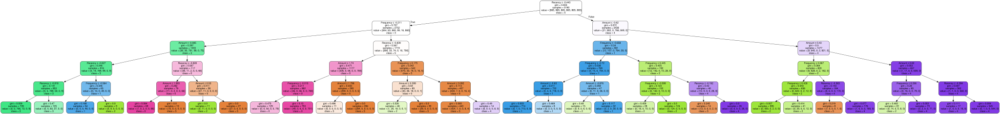

In [331]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import graphviz
from sklearn import tree



dot_data = tree.export_graphviz(clf_gini, out_file=None, 
                              feature_names=X_train.columns,  
                              class_names=y_train.apply(str),  
                              filled=True, rounded=True,  
                              special_characters=True)

graph = graphviz.Source(dot_data) 

graph 

In [332]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix

cf_matrix = confusion_matrix(y_test, y_pred_gini)

cf_matrix

array([[ 69,   2,   0,   0,   2,   9],
       [  3, 205,   2,   4,   2,   0],
       [  0,   2,  99,   0,   0,   9],
       [  0,   5,  10, 140,   0,   0],
       [  1,   9,   0,   0, 103,   0],
       [  2,   0,   0,   0,   0, 137]])

[Text(0, 0.5, '5'),
 Text(0, 1.5, '2'),
 Text(0, 2.5, '1'),
 Text(0, 3.5, '3'),
 Text(0, 4.5, '4'),
 Text(0, 5.5, '0')]

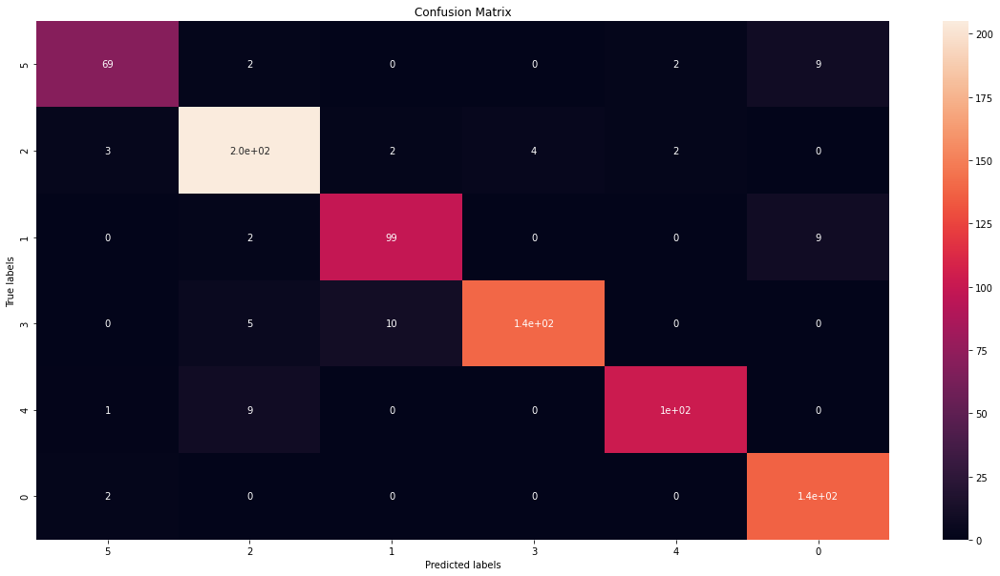

In [333]:
plt.figure(figsize=(20,10))
ax= plt.subplot()
sns.heatmap(cf_matrix, annot=True, ax = ax)  #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(y_test.unique())
ax.yaxis.set_ticklabels(y_test.unique())

In [334]:
print(classification_report(y_test, y_pred_gini))

              precision    recall  f1-score   support

           0       0.92      0.84      0.88        82
           1       0.92      0.95      0.93       216
           2       0.89      0.90      0.90       110
           3       0.97      0.90      0.94       155
           4       0.96      0.91      0.94       113
           5       0.88      0.99      0.93       139

    accuracy                           0.92       815
   macro avg       0.92      0.92      0.92       815
weighted avg       0.93      0.92      0.92       815



In [335]:
report = classification_report(y_test, y_pred_gini, output_dict=True)

df_report = pd.DataFrame(report).transpose()

dfi.export(df_report, 'gmm_gini.png')

# ENTROPY

In [336]:
training_loss = []
test_loss = []

def tree_scores(i):
    clf_en = DecisionTreeClassifier(criterion='entropy', max_depth=i, random_state = 42)
    
    
    clf_en.fit(X_train, y_train)
    y_pred_en = clf_en.predict_proba(X_test)
    y_pred_train_en = clf_en.predict_proba(X_train)
    
     
    print('Max Depth:' ,i)    
    print('Training set score: {:.4f}'.format(clf_en.score(X_train, y_train)))
    training_loss.append(log_loss(y_train, y_pred_train_en))

    print('Test set score: {:.4f}'.format(clf_en.score(X_test, y_test)))
    test_loss.append(log_loss(y_test, y_pred_en))
     
        
for i in range(1,11):
    tree_scores(i)

Max Depth: 1
Training set score: 0.3303
Test set score: 0.2736
Max Depth: 2
Training set score: 0.6187
Test set score: 0.5153
Max Depth: 3
Training set score: 0.8208
Test set score: 0.8282
Max Depth: 4
Training set score: 0.9295
Test set score: 0.9190
Max Depth: 5
Training set score: 0.9470
Test set score: 0.9276
Max Depth: 6
Training set score: 0.9726
Test set score: 0.9472
Max Depth: 7
Training set score: 0.9840
Test set score: 0.9571
Max Depth: 8
Training set score: 0.9929
Test set score: 0.9607
Max Depth: 9
Training set score: 0.9983
Test set score: 0.9620
Max Depth: 10
Training set score: 0.9994
Test set score: 0.9632


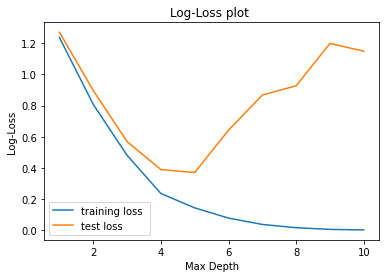

In [337]:
y = [1,2,3,4,5,6,7,8,9,10]

# plotting the line 1 points 
plt.plot(y, training_loss, label = "training loss ")

# plotting the line 2 points 
plt.plot(y, test_loss, label = "test loss ")
plt.xlabel('Max Depth')
# Set the y axis label of the current axis.
plt.ylabel('Log-Loss')
# Set a title of the current axes.
plt.title('Log-Loss plot ')
# show a legend on the plot
plt.legend()
# Display a figure.
plt.show()

In [338]:
parameters = {'max_depth':range(1,11)}
clf = GridSearchCV(DecisionTreeClassifier(criterion='entropy', random_state = 42),  parameters, n_jobs=4)
clf.fit(X=X_train, y=y_train)
tree_model = clf.best_estimator_
print (clf.best_score_, clf.best_params_) 

0.9761078998073218 {'max_depth': 10}


In [339]:
clf_en = DecisionTreeClassifier(criterion='entropy', max_depth=5, random_state = 42)

clf_en.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=5, random_state=42)

In [340]:
y_pred_en = clf_en.predict(X_test)

In [341]:
# print the scores on training and test set

print('Training set score: {:.4f}'.format(clf_en.score(X_train, y_train)))

print('Test set score: {:.4f}'.format(clf_en.score(X_test, y_test)))

Training set score: 0.9470
Test set score: 0.9276


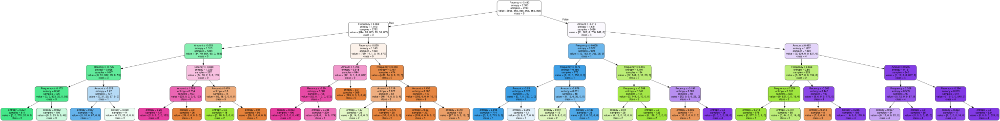

In [342]:
dot_data = tree.export_graphviz(clf_en, out_file=None, 
                              feature_names=X_train.columns,  
                              class_names=y_train.apply(str),  
                              filled=True, rounded=True,  
                              special_characters=True)

graph = graphviz.Source(dot_data) 

graph 

In [343]:
cm = confusion_matrix(y_test, y_pred_en)

print('Confusion matrix\n\n', cm)

Confusion matrix

 [[ 70   3   0   0   0   9]
 [  0 201   6   4   5   0]
 [  0   1 106   1   0   2]
 [  0   5   7 143   0   0]
 [  1   6   0   0 106   0]
 [  2   0   7   0   0 130]]


[Text(0, 0.5, '5'),
 Text(0, 1.5, '2'),
 Text(0, 2.5, '1'),
 Text(0, 3.5, '3'),
 Text(0, 4.5, '4'),
 Text(0, 5.5, '0')]

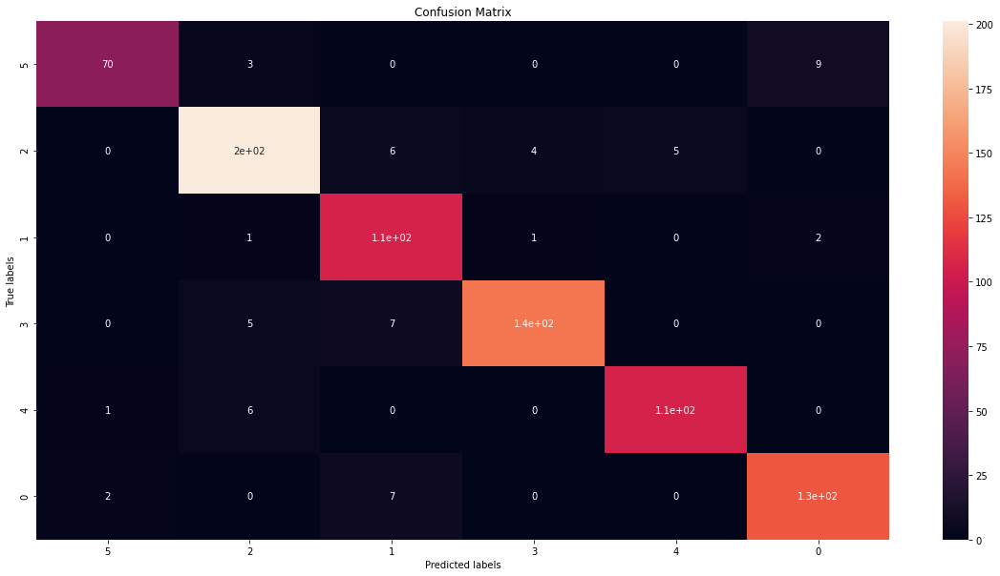

In [344]:
plt.figure(figsize=(20,10))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax)  #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(y_test.unique())
ax.yaxis.set_ticklabels(y_test.unique())

In [345]:
print(classification_report(y_test, y_pred_en))

              precision    recall  f1-score   support

           0       0.96      0.85      0.90        82
           1       0.93      0.93      0.93       216
           2       0.84      0.96      0.90       110
           3       0.97      0.92      0.94       155
           4       0.95      0.94      0.95       113
           5       0.92      0.94      0.93       139

    accuracy                           0.93       815
   macro avg       0.93      0.92      0.93       815
weighted avg       0.93      0.93      0.93       815



In [346]:
report = classification_report(y_test, y_pred_en, output_dict=True)

df_report = pd.DataFrame(report).transpose()

dfi.export(df_report, 'gmm_en.png')

# GRADIENT BOOSTING

In [347]:
training_loss = []
test_loss = []

def tree_scores(i):
    clf_gb = GradientBoostingClassifier( max_depth=i, random_state = 42)
    
    
    clf_gb.fit(X_train, y_train.values.ravel())
    y_pred_gb = clf_gb.predict_proba(X_test)
    y_pred_train_gb = clf_gb.predict_proba(X_train)
    
     
    print('Max Depth:' ,i)    
    print('Training set score: {:.4f}'.format(clf_gb.score(X_train, y_train)))
    training_loss.append(log_loss(y_train, y_pred_train_gb))

    print('Test set score: {:.4f}'.format(clf_gb.score(X_test, y_test)))
    test_loss.append(log_loss(y_test, y_pred_gb))
     
        
for i in range(1,11):
    tree_scores(i)

Max Depth: 1
Training set score: 0.9669
Test set score: 0.9534
Max Depth: 2
Training set score: 0.9931
Test set score: 0.9669
Max Depth: 3
Training set score: 1.0000
Test set score: 0.9693
Max Depth: 4
Training set score: 1.0000
Test set score: 0.9706
Max Depth: 5
Training set score: 1.0000
Test set score: 0.9742
Max Depth: 6
Training set score: 1.0000
Test set score: 0.9742
Max Depth: 7
Training set score: 1.0000
Test set score: 0.9755
Max Depth: 8
Training set score: 1.0000
Test set score: 0.9669
Max Depth: 9
Training set score: 1.0000
Test set score: 0.9742
Max Depth: 10
Training set score: 1.0000
Test set score: 0.9644


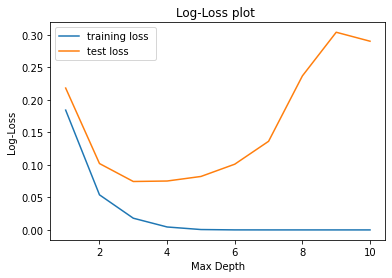

In [348]:
y = [1,2,3,4,5,6,7,8,9,10]

# plotting the line 1 points 
plt.plot(y, training_loss, label = "training loss ")

# plotting the line 2 points 
plt.plot(y, test_loss, label = "test loss ")
plt.xlabel('Max Depth')
# Set the y axis label of the current axis.
plt.ylabel('Log-Loss')
# Set a title of the current axes.
plt.title('Log-Loss plot ')
# show a legend on the plot
plt.legend()
# Display a figure.
plt.show()

In [ ]:
parameters = {'max_depth':range(1,11)}
clf = GridSearchCV(GradientBoostingClassifier( max_depth=i, random_state = 42),  parameters, n_jobs=4)
clf.fit(X=X_train, y=y_train.values.ravel())
tree_model = clf.best_estimator_
print (clf.best_score_, clf.best_params_) 

In [ ]:
clf_gb = GradientBoostingClassifier( max_depth=4, random_state = 42)

print('Cross-Validation Score:',np.mean(cross_val_score(clf_gb, X_train, y_train.values.ravel(), cv=10)))

In [349]:
clf_gb = GradientBoostingClassifier( max_depth=3, random_state = 42)

clf_gb.fit(X_train, y_train.values.ravel())

GradientBoostingClassifier(random_state=42)

In [350]:
y_pred_gb = clf_gb.predict(X_test)

In [351]:
# print the scores on training and test set

print('Training set score: {:.4f}'.format(clf_gb.score(X_train, y_train)))

print('Test set score: {:.4f}'.format(clf_gb.score(X_test, y_test)))

Training set score: 1.0000
Test set score: 0.9693


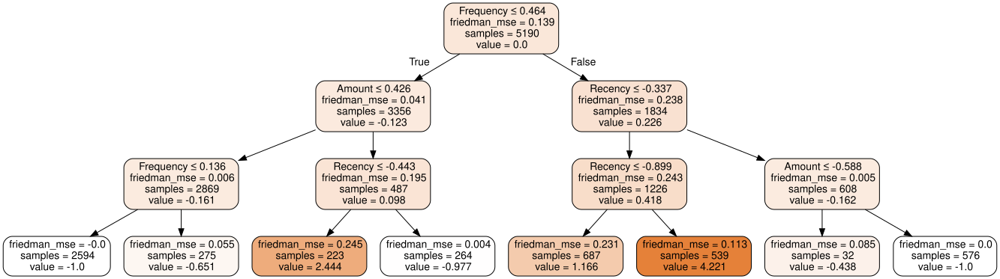

In [352]:
dot_data = tree.export_graphviz(clf_gb.estimators_[0, 0], out_file=None, 
                              feature_names=X_train.columns,  
                              class_names=y_train.apply(str),  
                              filled=True, rounded=True,  
                              special_characters=True)

graph = graphviz.Source(dot_data) 

graph 

In [353]:
cm = confusion_matrix(y_test, y_pred_gb)

print('Confusion matrix\n\n', cm)

Confusion matrix

 [[ 77   2   0   0   0   3]
 [  0 209   1   1   2   3]
 [  0   0 108   0   0   2]
 [  0   1   1 153   0   0]
 [  3   2   0   0 108   0]
 [  2   0   2   0   0 135]]


[Text(0, 0.5, '5'),
 Text(0, 1.5, '2'),
 Text(0, 2.5, '1'),
 Text(0, 3.5, '3'),
 Text(0, 4.5, '4'),
 Text(0, 5.5, '0')]

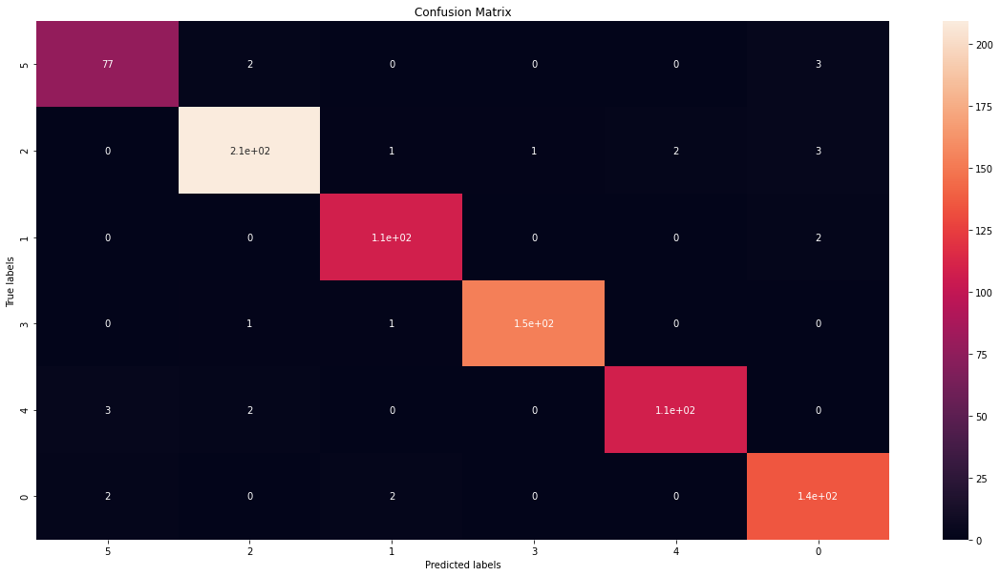

In [354]:
plt.figure(figsize=(20,10))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax)  #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(pd.unique(y_test.values.ravel()))
ax.yaxis.set_ticklabels(pd.unique(y_test.values.ravel()))

In [355]:
print(classification_report(y_test, y_pred_gb))

              precision    recall  f1-score   support

           0       0.94      0.94      0.94        82
           1       0.98      0.97      0.97       216
           2       0.96      0.98      0.97       110
           3       0.99      0.99      0.99       155
           4       0.98      0.96      0.97       113
           5       0.94      0.97      0.96       139

    accuracy                           0.97       815
   macro avg       0.97      0.97      0.97       815
weighted avg       0.97      0.97      0.97       815



In [356]:
report = classification_report(y_test, y_pred_gb, output_dict=True)

df_report = pd.DataFrame(report).transpose()

dfi.export(df_report, 'gmm_gb.png')

# XGBOOST

In [48]:
import xgboost as xgb 
from sklearn.metrics import log_loss

training_loss = []
test_loss = []

def tree_scores(i):
    clf_xgb = xgb.XGBClassifier( max_depth=i, random_state = 42, n_jobs = 4)
    
    
    clf_xgb.fit(X_train, y_train.values.ravel())
    y_pred_xgb = clf_xgb.predict_proba(X_test)
    y_pred_train_xgb = clf_xgb.predict_proba(X_train)
    
     
    print('Max Depth:' ,i)    
    print('Training set score: {:.4f}'.format(clf_xgb.score(X_train, y_train)))
    training_loss.append(log_loss(y_train, y_pred_train_xgb))

    print('Test set score: {:.4f}'.format(clf_xgb.score(X_test, y_test)))
    test_loss.append(log_loss(y_test, y_pred_xgb))
     
        
for i in range(1,11):
    tree_scores(i)

[20:22:14] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Max Depth: 1
Training set score: 0.9767
Test set score: 0.9595
[20:22:14] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Max Depth: 2
Training set score: 0.9975
Test set score: 0.9755
[20:22:15] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Max Depth: 3
Training set score: 0.9998
Test set score: 0.9742
[20:22:17] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Max Depth: 4
Training set score: 1.0000
Test set score: 0.9706
[20:22:19] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Max Depth: 5
Training set score: 1.0000
Test set score: 0.9706


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[20:22:22] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Max Depth: 6
Training set score: 1.0000
Test set score: 0.9693
[20:22:26] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Max Depth: 7
Training set score: 1.0000
Test set score: 0.9706
[20:22:27] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Max Depth: 8
Training set score: 1.0000
Test set score: 0.9706
[20:22:29] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Max Depth: 9
Training set score: 1.0000
Test set score: 0.9742
[20:22:31] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Max Depth: 10
Training set score: 1.0000
Test set score: 0.9730


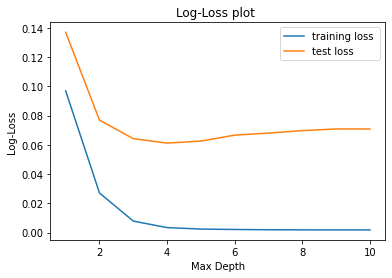

In [49]:
y = [1,2,3,4,5,6,7,8,9,10]

# plotting the line 1 points 
plt.plot(y, training_loss, label = "training loss ")

# plotting the line 2 points 
plt.plot(y, test_loss, label = "test loss ")
plt.xlabel('Max Depth')
# Set the y axis label of the current axis.
plt.ylabel('Log-Loss')
# Set a title of the current axes.
plt.title('Log-Loss plot ')
# show a legend on the plot
plt.legend()
# Display a figure.
plt.show()

In [403]:
parameters = {'max_depth':range(1,11)}
clf = GridSearchCV(xgb.XGBClassifier( max_depth=i, random_state = 42),  parameters, n_jobs=4)
clf.fit(X=X_train, y=y_train.values.ravel())
tree_model = clf.best_estimator_
print (clf.best_score_, clf.best_params_) 

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[10:53:06] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
0.9911212548171882 {'max_depth': 3}


In [50]:
clf_xgb = xgb.XGBClassifier( max_depth=3, random_state = 42, n_jobs = 4)

print('Cross-Validation Score:',np.mean(cross_val_score(clf_xgb, X_train, y_train.values.ravel(), cv=10)))

NameError: name 'cross_val_score' is not defined

In [51]:
clf_xgb = xgb.XGBClassifier( max_depth=2, random_state = 42, n_jobs = 4)

clf_xgb.fit(X_train, y_train.values.ravel())

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[20:22:59] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=2,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=4, num_parallel_tree=1,
              objective='multi:softprob', random_state=42, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [52]:
y_pred_xgb = clf_xgb.predict(X_test)

In [53]:
# print the scores on training and test set

print('Training set score: {:.4f}'.format(clf_xgb.score(X_train, y_train)))

print('Test set score: {:.4f}'.format(clf_xgb.score(X_test, y_test)))

Training set score: 0.9975
Test set score: 0.9755


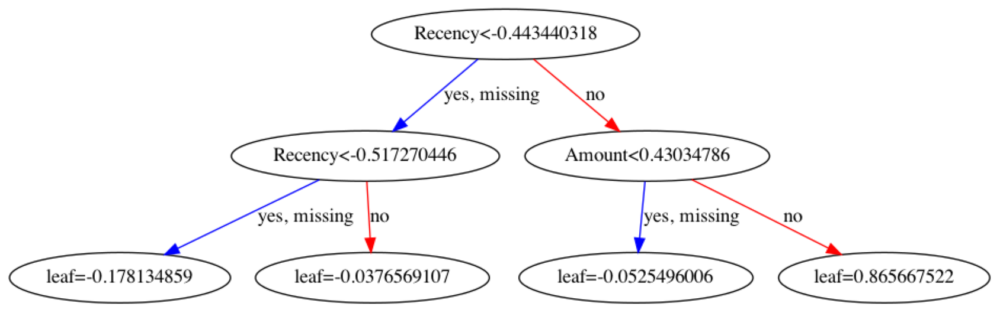

In [54]:
fig, ax = plt.subplots(figsize=(30, 30))
xgb.plot_tree(clf_xgb, num_trees=4, ax=ax)
plt.show()

In [57]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred_xgb)

print('Confusion matrix\n\n', cm)

Confusion matrix

 [[ 77   2   0   0   1   2]
 [  1 212   0   0   0   3]
 [  0   0 107   1   0   2]
 [  0   1   1 153   0   0]
 [  0   2   0   0 111   0]
 [  1   0   3   0   0 135]]


NameError: name 'sns' is not defined

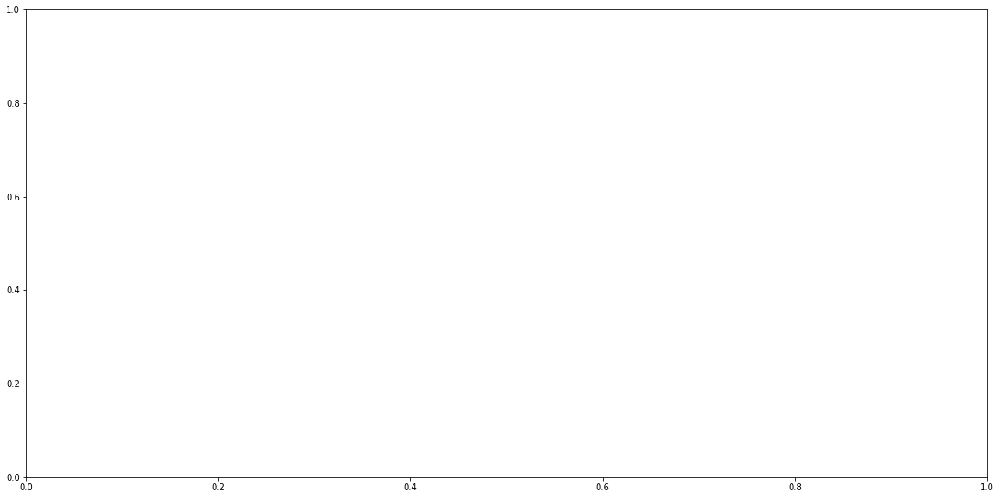

In [58]:
plt.figure(figsize=(20,10))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax)  #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(pd.unique(y_test.values.ravel()))
ax.yaxis.set_ticklabels(pd.unique(y_test.values.ravel()))

In [61]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred_xgb))

              precision    recall  f1-score   support

           0       0.97      0.94      0.96        82
           1       0.98      0.98      0.98       216
           2       0.96      0.97      0.97       110
           3       0.99      0.99      0.99       155
           4       0.99      0.98      0.99       113
           5       0.95      0.97      0.96       139

    accuracy                           0.98       815
   macro avg       0.98      0.97      0.97       815
weighted avg       0.98      0.98      0.98       815



In [63]:
import dataframe_image as dfi 
report = classification_report(y_test, y_pred_xgb, output_dict=True)

df_report = pd.DataFrame(report).transpose()

dfi.export(df_report, 'gmm_xgb.png')

<h3 id="Kmeans_Dataset">
3.4 KMeans Dataset
<a class="anchor-link" href="https://www.kaggle.com/johnmantios/travel-review-ratings-dataset/edit/run/47115230#Kmeans_Dataset">¶</a>
</h3>

### 3.4.1 Decision Tree

In [357]:
RFM_kmeans.describe()

,Frequency,Amount,Recency,kmeans
count,4.075000e+03,4.075000e+03,4.075000e+03,4075.000000
mean,1.046198e-16,6.756695e-17,1.394931e-17,0.912393
std,1.000123e+00,1.000123e+00,1.000123e+00,0.767805
min,-1.265897e+00,-9.054806e-01,-1.175814e+00,0.000000
25%,-8.211020e-01,-7.604353e-01,-9.362245e-01,0.000000
50%,-2.736615e-01,-3.322284e-01,-2.312798e-01,1.000000
75%,6.501444e-01,4.094029e-01,7.685438e-01,2.000000
max,2.600401e+00,4.398553e+00,2.224508e+00,2.000000


In [358]:
RFM_kmeans.drop_duplicates()

,Frequency,Amount,Recency,kmeans
0,-0.136801,-0.343723,0.321618,0
1,0.444854,0.434165,-0.830252,1
2,-0.718457,-0.604882,0.252506,0
3,-0.581597,-0.721754,0.551992,0
4,2.224036,1.164892,-1.009944,2
...,...,...,...,...
4070,-0.718457,-0.684149,-0.346467,1
4071,-0.889532,-0.259715,-1.143561,1
4072,-0.342092,-0.553931,0.810011,0
4073,-0.889532,-0.271298,1.865124,0


In [359]:
for col in RFM_kmeans.columns:
    print(RFM_kmeans[col].value_counts())

-1.265897    118
-0.923747     87
-1.094822     85
-0.992177     80
-0.957962     80
            ... 
 2.292466     10
 2.224036     10
 2.360896      8
 2.429326      7
 2.600401      7
Name: Frequency, Length: 114, dtype: int64
-0.905481    403
-0.887498      7
-0.901778      6
-0.879035      5
-0.870572      5
            ... 
-0.279602      1
 0.296454      1
-0.564086      1
 1.143506      1
-0.040551      1
Name: Amount, Length: 3525, dtype: int64
-1.157384    39
-1.097486    37
-1.129739    34
-1.143561    32
-1.125131    31
             ..
 1.588676     1
 1.155572     1
 2.063246     1
 0.137319     1
-0.023943     1
Name: Recency, Length: 588, dtype: int64
1    1642
0    1395
2    1038
Name: kmeans, dtype: int64


In [360]:
X = RFM_kmeans.drop(['kmeans'], axis = 1)
y = RFM_kmeans['kmeans']

In [361]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 42, stratify=y)

In [362]:
print(y_test.value_counts()) #we secured the 20% in the classes represenation

1    328
0    279
2    208
Name: kmeans, dtype: int64


In [363]:
sm = SMOTE(random_state = 42)
           
X_train, y_train = sm.fit_sample(X_train, y_train) 

In [364]:
print(y_train.value_counts())

1    1314
2    1314
0    1314
Name: kmeans, dtype: int64


# GINI CRITERION

In [365]:
training_scores = []
test_scores = []

def tree_scores(i):
    clf_gini = DecisionTreeClassifier(criterion='gini', max_depth=i, random_state = 42)
    
    
    clf_gini.fit(X_train, y_train)
    y_pred_gini = clf_gini.predict_proba(X_test)
    y_pred_train_gini = clf_gini.predict_proba(X_train)
    
     
    print('Max Depth:' ,i)    
    print('Training set score: {:.4f}'.format(clf_gini.score(X_train, y_train)))
    training_scores.append(log_loss(y_train, y_pred_train_gini))

    print('Test set score: {:.4f}'.format(clf_gini.score(X_test, y_test)))
    test_scores.append(log_loss(y_test, y_pred_gini))
     
        
for i in range(1,11):
    tree_scores(i)

Max Depth: 1
Training set score: 0.6603
Test set score: 0.7362
Max Depth: 2
Training set score: 0.8978
Test set score: 0.8859
Max Depth: 3
Training set score: 0.9353
Test set score: 0.9411
Max Depth: 4
Training set score: 0.9691
Test set score: 0.9571
Max Depth: 5
Training set score: 0.9845
Test set score: 0.9706
Max Depth: 6
Training set score: 0.9944
Test set score: 0.9779
Max Depth: 7
Training set score: 0.9982
Test set score: 0.9767
Max Depth: 8
Training set score: 1.0000
Test set score: 0.9706
Max Depth: 9
Training set score: 1.0000
Test set score: 0.9706
Max Depth: 10
Training set score: 1.0000
Test set score: 0.9706


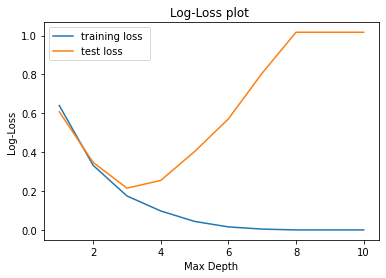

In [366]:
y = [1,2,3,4,5,6,7,8,9,10]

# plotting the line 1 points 
plt.plot(y, training_scores, label = "training loss ")

# plotting the line 2 points 
plt.plot(y, test_scores, label = "test loss ")
plt.xlabel('Max Depth')
# Set the y axis label of the current axis.
plt.ylabel('Log-Loss')
# Set a title of the current axes.
plt.title('Log-Loss plot ')
# show a legend on the plot
plt.legend()
# Display a figure.
plt.show()

In [367]:
parameters = {'max_depth':range(1,11)}
clf = GridSearchCV(DecisionTreeClassifier(criterion='gini', random_state = 42),  parameters, n_jobs=4)
clf.fit(X=X_train, y=y_train)
tree_model = clf.best_estimator_
print (clf.best_score_, clf.best_params_) 

0.9824947083309207 {'max_depth': 7}


In [369]:
clf_gini = DecisionTreeClassifier(criterion='gini', max_depth=3, random_state = 42)

print('Cross-Validation Score:',np.mean(cross_val_score(clf_gini, X_train, y_train, cv=10)))

Cross-Validation Score: 0.9325232924243398


In [370]:
clf_gini = DecisionTreeClassifier(criterion='gini', max_depth=4, random_state = 42)

clf_gini.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=4, random_state=42)

In [371]:
y_pred_gini = clf_gini.predict(X_test)

In [372]:
print('Training set score: {:.4f}'.format(clf_gini.score(X_train, y_train)))

print('Test set score: {:.4f}'.format(clf_gini.score(X_test, y_test)))

Training set score: 0.9691
Test set score: 0.9571


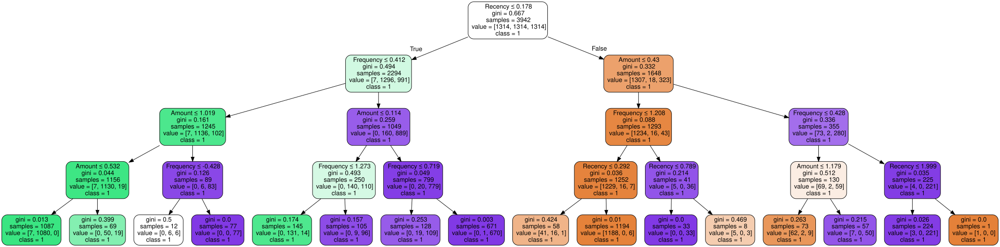

In [373]:
dot_data = tree.export_graphviz(clf_gini, out_file=None, 
                              feature_names=X_train.columns,  
                              class_names=y_train.apply(str),  
                              filled=True, rounded=True,  
                              special_characters=True)

graph = graphviz.Source(dot_data) 

graph 

In [374]:
cf_matrix = confusion_matrix(y_test, y_pred_gini)

cf_matrix

array([[275,   3,   1],
       [  4, 312,  12],
       [  8,   7, 193]])

[Text(0, 0.5, '1'), Text(0, 1.5, '0'), Text(0, 2.5, '2')]

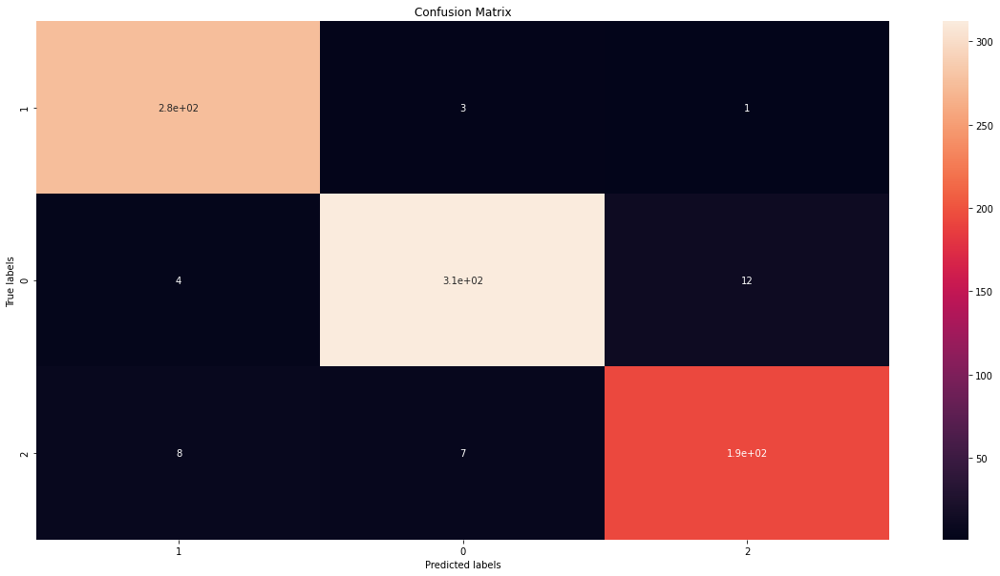

In [375]:
plt.figure(figsize=(20,10))
ax= plt.subplot()
sns.heatmap(cf_matrix, annot=True, ax = ax)  #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(y_test.unique())
ax.yaxis.set_ticklabels(y_test.unique())

In [376]:
print(classification_report(y_test, y_pred_gini))

              precision    recall  f1-score   support

           0       0.96      0.99      0.97       279
           1       0.97      0.95      0.96       328
           2       0.94      0.93      0.93       208

    accuracy                           0.96       815
   macro avg       0.95      0.95      0.95       815
weighted avg       0.96      0.96      0.96       815



In [377]:
report = classification_report(y_test, y_pred_gini, output_dict=True)

df_report = pd.DataFrame(report).transpose()

dfi.export(df_report, 'kmeans_gini.png')

# ENTROPY

In [378]:
training_loss = []
test_loss = []

def tree_scores(i):
    clf_en = DecisionTreeClassifier(criterion='entropy', max_depth=i, random_state = 42)
    
    
    clf_en.fit(X_train, y_train)
    y_pred_en = clf_en.predict_proba(X_test)
    y_pred_train_en = clf_en.predict_proba(X_train)
    
     
    print('Max Depth:' ,i)    
    print('Training set score: {:.4f}'.format(clf_en.score(X_train, y_train)))
    training_loss.append(log_loss(y_train, y_pred_train_en))

    print('Test set score: {:.4f}'.format(clf_en.score(X_test, y_test)))
    test_loss.append(log_loss(y_test, y_pred_en))
     
        
for i in range(1,11):
    tree_scores(i)

Max Depth: 1
Training set score: 0.6601
Test set score: 0.7350
Max Depth: 2
Training set score: 0.8975
Test set score: 0.8871
Max Depth: 3
Training set score: 0.9224
Test set score: 0.9337
Max Depth: 4
Training set score: 0.9680
Test set score: 0.9546
Max Depth: 5
Training set score: 0.9840
Test set score: 0.9693
Max Depth: 6
Training set score: 0.9929
Test set score: 0.9779
Max Depth: 7
Training set score: 0.9982
Test set score: 0.9767
Max Depth: 8
Training set score: 0.9997
Test set score: 0.9742
Max Depth: 9
Training set score: 0.9997
Test set score: 0.9742
Max Depth: 10
Training set score: 1.0000
Test set score: 0.9742


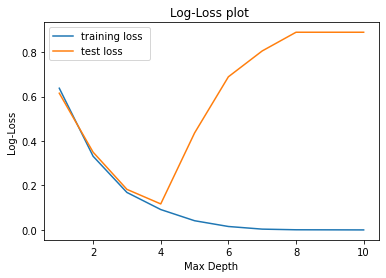

In [379]:
y = [1,2,3,4,5,6,7,8,9,10]

# plotting the line 1 points 
plt.plot(y, training_loss, label = "training loss ")

# plotting the line 2 points 
plt.plot(y, test_loss, label = "test loss ")
plt.xlabel('Max Depth')
# Set the y axis label of the current axis.
plt.ylabel('Log-Loss')
# Set a title of the current axes.
plt.title('Log-Loss plot ')
# show a legend on the plot
plt.legend()
# Display a figure.
plt.show()

In [380]:
parameters = {'max_depth':range(1,11)}
clf = GridSearchCV(DecisionTreeClassifier(criterion='entropy', random_state = 42),  parameters, n_jobs=4)
clf.fit(X=X_train, y=y_train)
tree_model = clf.best_estimator_
print (clf.best_score_, clf.best_params_) 

0.9817345737391673 {'max_depth': 9}


In [381]:
clf_en = DecisionTreeClassifier(criterion='entropy', max_depth=3, random_state = 42)

clf_en.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=3, random_state=42)

In [382]:
y_pred_en = clf_en.predict(X_test)

In [383]:
# print the scores on training and test set

print('Training set score: {:.4f}'.format(clf_en.score(X_train, y_train)))

print('Test set score: {:.4f}'.format(clf_en.score(X_test, y_test)))

Training set score: 0.9224
Test set score: 0.9337


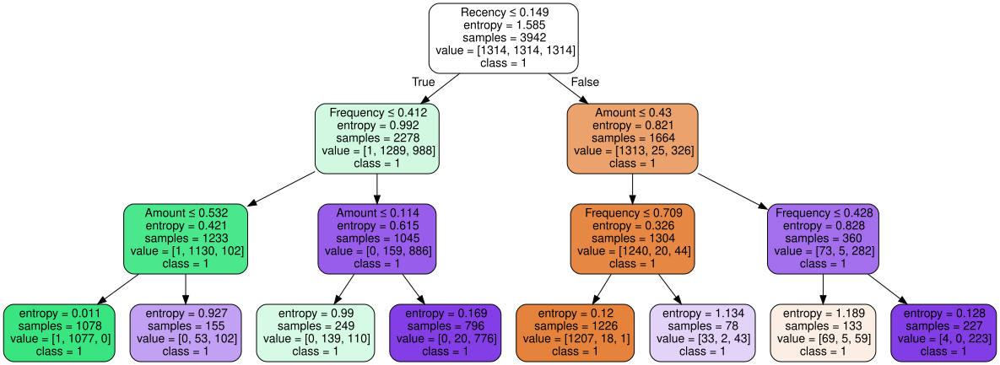

In [384]:
dot_data = tree.export_graphviz(clf_en, out_file=None, 
                              feature_names=X_train.columns,  
                              class_names=y_train.apply(str),  
                              filled=True, rounded=True,  
                              special_characters=True)

graph = graphviz.Source(dot_data) 

graph 

In [385]:
cm = confusion_matrix(y_test, y_pred_en)

print('Confusion matrix\n\n', cm)

Confusion matrix

 [[270   2   7]
 [  5 304  19]
 [  8  13 187]]


[Text(0, 0.5, '1'), Text(0, 1.5, '0'), Text(0, 2.5, '2')]

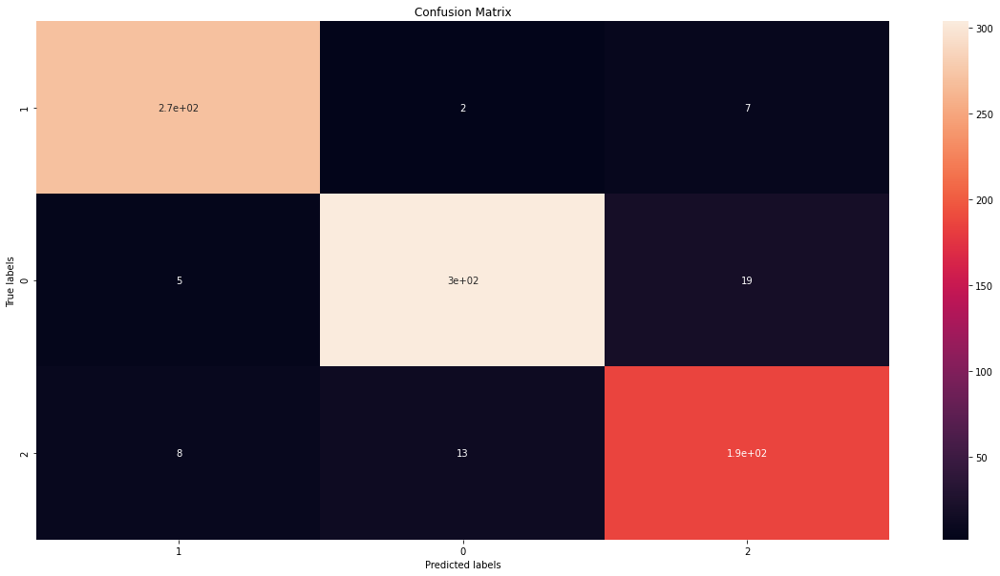

In [386]:
plt.figure(figsize=(20,10))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax)  #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(y_test.unique())
ax.yaxis.set_ticklabels(y_test.unique())

In [387]:
print(classification_report(y_test, y_pred_en))

              precision    recall  f1-score   support

           0       0.95      0.97      0.96       279
           1       0.95      0.93      0.94       328
           2       0.88      0.90      0.89       208

    accuracy                           0.93       815
   macro avg       0.93      0.93      0.93       815
weighted avg       0.93      0.93      0.93       815



In [388]:
report = classification_report(y_test, y_pred_en, output_dict=True)

df_report = pd.DataFrame(report).transpose()

dfi.export(df_report, 'kmeans_en.png')

# GRADIENT BOOSTING

In [389]:
training_loss = []
test_loss = []

def tree_scores(i):
    clf_gb = GradientBoostingClassifier( max_depth=i, random_state = 42)
    
    
    clf_gb.fit(X_train, y_train.values.ravel())
    y_pred_gb = clf_gb.predict_proba(X_test)
    y_pred_train_gb = clf_gb.predict_proba(X_train)
    
     
    print('Max Depth:' ,i)    
    print('Training set score: {:.4f}'.format(clf_gb.score(X_train, y_train)))
    training_loss.append(log_loss(y_train, y_pred_train_gb))

    print('Test set score: {:.4f}'.format(clf_gb.score(X_test, y_test)))
    test_loss.append(log_loss(y_test, y_pred_gb))
     
        
for i in range(1,11):
    tree_scores(i)

Max Depth: 1
Training set score: 0.9827
Test set score: 0.9669
Max Depth: 2
Training set score: 0.9982
Test set score: 0.9853
Max Depth: 3
Training set score: 1.0000
Test set score: 0.9853
Max Depth: 4
Training set score: 1.0000
Test set score: 0.9816
Max Depth: 5
Training set score: 1.0000
Test set score: 0.9828
Max Depth: 6
Training set score: 1.0000
Test set score: 0.9853
Max Depth: 7
Training set score: 1.0000
Test set score: 0.9828
Max Depth: 8
Training set score: 1.0000
Test set score: 0.9755
Max Depth: 9
Training set score: 1.0000
Test set score: 0.9730
Max Depth: 10
Training set score: 1.0000
Test set score: 0.9730


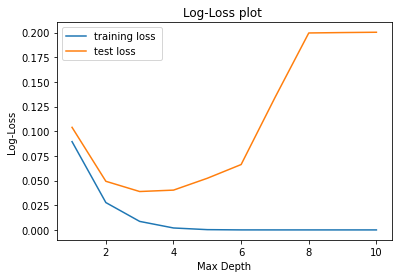

In [390]:
y = [1,2,3,4,5,6,7,8,9,10]

# plotting the line 1 points 
plt.plot(y, training_loss, label = "training loss ")

# plotting the line 2 points 
plt.plot(y, test_loss, label = "test loss ")
plt.xlabel('Max Depth')
# Set the y axis label of the current axis.
plt.ylabel('Log-Loss')
# Set a title of the current axes.
plt.title('Log-Loss plot ')
# show a legend on the plot
plt.legend()
# Display a figure.
plt.show()

In [391]:
parameters = {'max_depth':range(1,11)}
clf = GridSearchCV(GradientBoostingClassifier( max_depth=i, random_state = 42),  parameters, n_jobs=4)
clf.fit(X=X_train, y=y_train.values.ravel())
tree_model = clf.best_estimator_
print (clf.best_score_, clf.best_params_) 

0.989852540966204 {'max_depth': 4}


In [392]:
clf_gb = GradientBoostingClassifier( max_depth=3, random_state = 42)

print('Cross-Validation Score:',np.mean(cross_val_score(clf_gb, X_train, y_train.values.ravel(), cv=10)))

Cross-Validation Score: 0.9895984064769003


In [393]:
clf_gb = GradientBoostingClassifier( max_depth=3, random_state = 42)

clf_gb.fit(X_train, y_train.values.ravel())

GradientBoostingClassifier(random_state=42)

In [394]:
y_pred_gb = clf_gb.predict(X_test)

In [395]:
# print the scores on training and test set

print('Training set score: {:.4f}'.format(clf_gb.score(X_train, y_train)))

print('Test set score: {:.4f}'.format(clf_gb.score(X_test, y_test)))

Training set score: 1.0000
Test set score: 0.9853


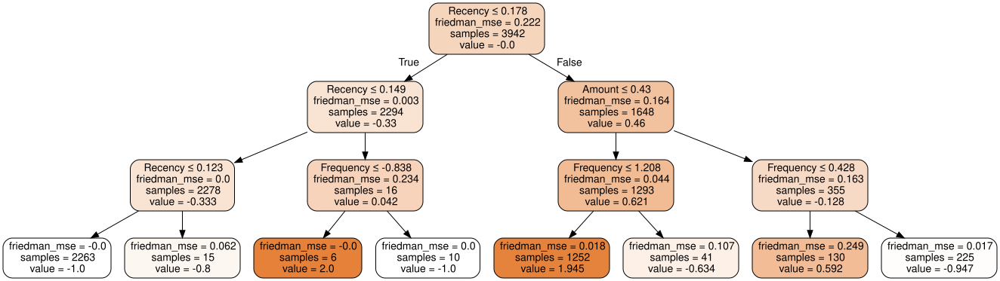

In [396]:
dot_data = tree.export_graphviz(clf_gb.estimators_[0, 0], out_file=None, 
                              feature_names=X_train.columns,  
                              class_names=y_train.apply(str),  
                              filled=True, rounded=True,  
                              special_characters=True)

graph = graphviz.Source(dot_data) 

graph 

In [397]:
cm = confusion_matrix(y_test, y_pred_gb)

print('Confusion matrix\n\n', cm)

Confusion matrix

 [[275   3   1]
 [  0 326   2]
 [  3   3 202]]


[Text(0, 0.5, '1'), Text(0, 1.5, '0'), Text(0, 2.5, '2')]

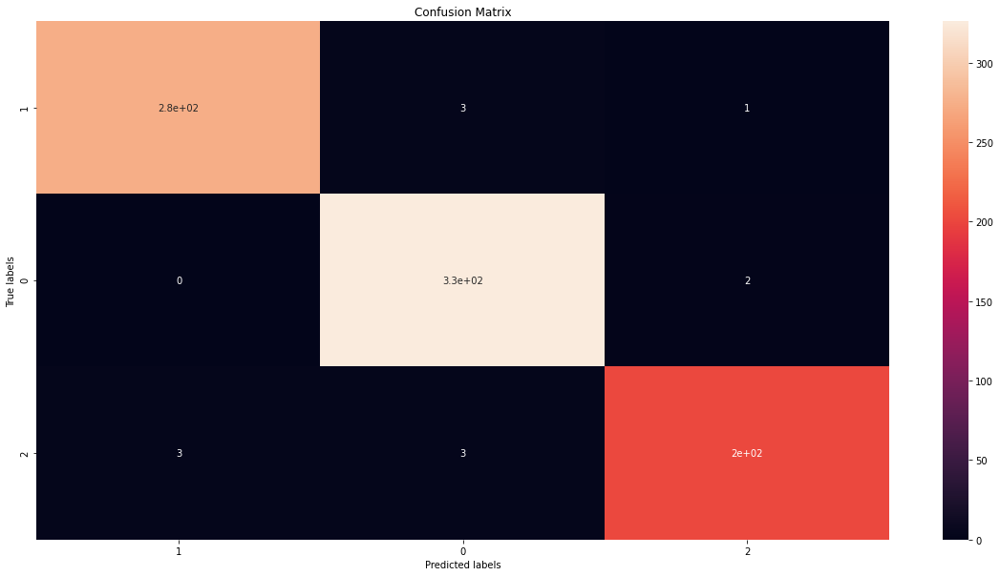

In [398]:
plt.figure(figsize=(20,10))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax)  #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(pd.unique(y_test.values.ravel()))
ax.yaxis.set_ticklabels(pd.unique(y_test.values.ravel()))

In [399]:
print(classification_report(y_test, y_pred_gb))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99       279
           1       0.98      0.99      0.99       328
           2       0.99      0.97      0.98       208

    accuracy                           0.99       815
   macro avg       0.99      0.98      0.98       815
weighted avg       0.99      0.99      0.99       815



In [400]:
report = classification_report(y_test, y_pred_gb, output_dict=True)

df_report = pd.DataFrame(report).transpose()

dfi.export(df_report, 'kmeans_gb.png')

# XGBOOST

In [401]:
training_loss = []
test_loss = []

def tree_scores(i):
    clf_xgb = xgb.XGBClassifier( max_depth=i, random_state = 42, n_jobs = 4)
    
    
    clf_xgb.fit(X_train, y_train.values.ravel())
    y_pred_xgb = clf_xgb.predict_proba(X_test)
    y_pred_train_xgb = clf_xgb.predict_proba(X_train)
    
     
    print('Max Depth:' ,i)    
    print('Training set score: {:.4f}'.format(clf_xgb.score(X_train, y_train)))
    training_loss.append(log_loss(y_train, y_pred_train_xgb))

    print('Test set score: {:.4f}'.format(clf_xgb.score(X_test, y_test)))
    test_loss.append(log_loss(y_test, y_pred_xgb))
     
        
for i in range(1,11):
    tree_scores(i)

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[10:52:06] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Max Depth: 1
Training set score: 0.9939
Test set score: 0.9828
[10:52:07] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



Max Depth: 2
Training set score: 1.0000
Test set score: 0.9840
[10:52:07] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



Max Depth: 3
Training set score: 1.0000
Test set score: 0.9840
[10:52:09] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



Max Depth: 4
Training set score: 1.0000
Test set score: 0.9853
[10:52:10] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



Max Depth: 5
Training set score: 1.0000
Test set score: 0.9840
[10:52:11] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



Max Depth: 6
Training set score: 1.0000
Test set score: 0.9840
[10:52:12] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



Max Depth: 7
Training set score: 1.0000
Test set score: 0.9853
[10:52:13] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



Max Depth: 8
Training set score: 1.0000
Test set score: 0.9865
[10:52:13] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



Max Depth: 9
Training set score: 1.0000
Test set score: 0.9865
[10:52:14] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



Max Depth: 10
Training set score: 1.0000
Test set score: 0.9865


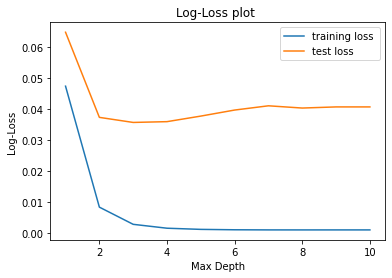

In [402]:
y = [1,2,3,4,5,6,7,8,9,10]

# plotting the line 1 points 
plt.plot(y, training_loss, label = "training loss ")

# plotting the line 2 points 
plt.plot(y, test_loss, label = "test loss ")
plt.xlabel('Max Depth')
# Set the y axis label of the current axis.
plt.ylabel('Log-Loss')
# Set a title of the current axes.
plt.title('Log-Loss plot ')
# show a legend on the plot
plt.legend()
# Display a figure.
plt.show()

In [403]:
parameters = {'max_depth':range(1,11)}
clf = GridSearchCV(xgb.XGBClassifier( max_depth=i, random_state = 42),  parameters, n_jobs=4)
clf.fit(X=X_train, y=y_train.values.ravel())
tree_model = clf.best_estimator_
print (clf.best_score_, clf.best_params_) 

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[10:53:06] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
0.9911212548171882 {'max_depth': 3}


In [404]:
clf_xgb = xgb.XGBClassifier( max_depth=2, random_state = 42, n_jobs = 4)

print('Cross-Validation Score:',np.mean(cross_val_score(clf_xgb, X_train, y_train.values.ravel(), cv=10)))

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[10:53:13] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[10:53:13] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[10:53:14] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[10:53:14] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd li

In [405]:
clf_xgb = xgb.XGBClassifier( max_depth=2, random_state = 42, n_jobs = 4)

clf_xgb.fit(X_train, y_train.values.ravel())

[10:53:19] WARNING: xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=2,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=4, num_parallel_tree=1,
              objective='multi:softprob', random_state=42, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [406]:
y_pred_xgb = clf_xgb.predict(X_test)

In [407]:
# print the scores on training and test set

print('Training set score: {:.4f}'.format(clf_xgb.score(X_train, y_train)))

print('Test set score: {:.4f}'.format(clf_xgb.score(X_test, y_test)))

Training set score: 1.0000
Test set score: 0.9840


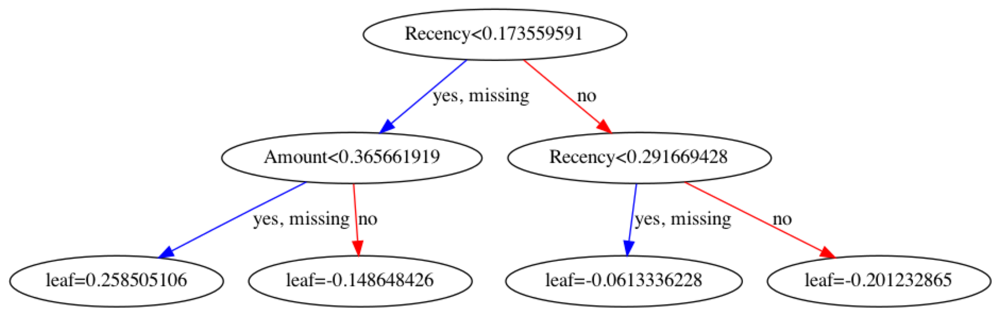

In [419]:
fig, ax = plt.subplots(figsize=(30, 30))
xgb.plot_tree(clf_xgb, num_trees=4, ax=ax)
plt.show()

In [409]:
cm = confusion_matrix(y_test, y_pred_xgb)

print('Confusion matrix\n\n', cm)

Confusion matrix

 [[276   2   1]
 [  0 325   3]
 [  3   4 201]]


[Text(0, 0.5, '1'), Text(0, 1.5, '0'), Text(0, 2.5, '2')]

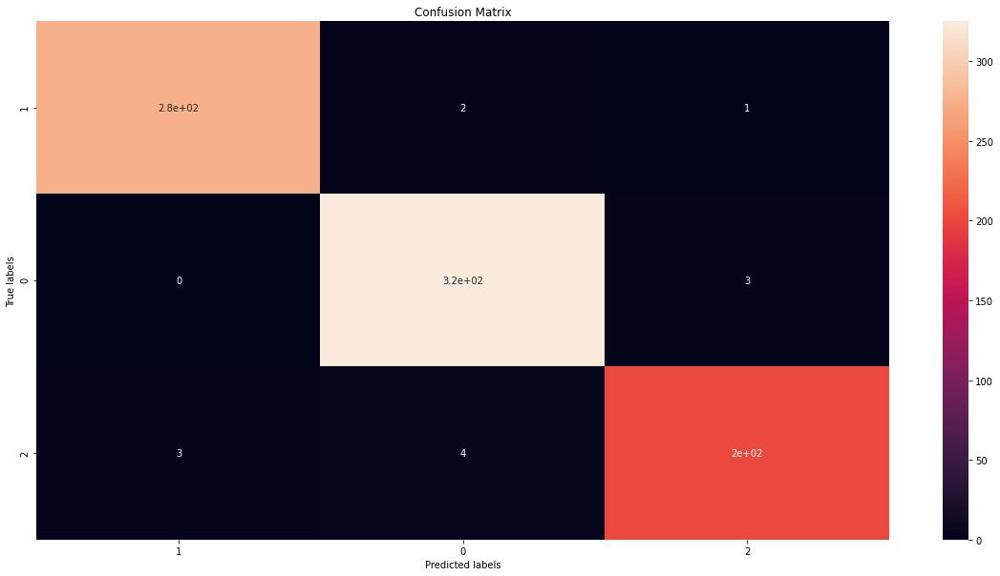

In [410]:
plt.figure(figsize=(20,10))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax)  #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(pd.unique(y_test.values.ravel()))
ax.yaxis.set_ticklabels(pd.unique(y_test.values.ravel()))

In [411]:
print(classification_report(y_test, y_pred_xgb))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99       279
           1       0.98      0.99      0.99       328
           2       0.98      0.97      0.97       208

    accuracy                           0.98       815
   macro avg       0.98      0.98      0.98       815
weighted avg       0.98      0.98      0.98       815



In [412]:
report = classification_report(y_test, y_pred_xgb, output_dict=True)

df_report = pd.DataFrame(report).transpose()

dfi.export(df_report, 'kmeans_xgb.png')